In [ ]:
!pip install neurokit2
!pip install wfdb
!pip install imblearn
!pip install minisom
!pip install hpelm
!pip install sklearn-rvm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 696.5/696.5 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 38.3 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.3.0 which is incompatible.
cudf-cu12 25.2.1 requires pandas<2.2.4dev0,>=2.0, but you have pandas 2.3.0 which is incompatible.
dask-cudf-cu12 25.2.2 requires pandas<2.2.4dev0,>=2.0, but you have pandas 2.3.0 which is incompatible.
  Preparing metadata (setup.py) ... done
  Created wheel f

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import wfdb
import neurokit2 as nk
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE
import joblib
import time
from hpelm import ELM
from sklearn_rvm import EMRVC
from minisom import MiniSom

# Tambahan imports untuk CNN-LSTM
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Daftar sampel dan path
sampel = ['04015', '04043', '04048', '04126', '04746',
          '04908', '04936', '05091', '05121', '05261',
          '06426', '06453', '06995', '07162', '07859',
          '07879', '07910', '08215', '08219', '08378',
          '08405', '08434', '08455']
path = '/content/drive/MyDrive/Experiments/CardioSense/data'

In [ ]:
jumlah_data = 0
afib = 0
n = 0

In [ ]:
for sampels in sampel:
    record_name = f'{path}/af-database/{sampels}'
    record = wfdb.rdsamp(record_name)
    annotation = wfdb.rdann(record_name, 'atr')
    data = pd.DataFrame(record[0])
    anotasi = annotation.sample
    tipe = annotation.aux_note

    for i in range(len(anotasi)-1):
        data_cut = data.iloc[anotasi[i]:anotasi[i+1]]
        if tipe[i] == '(N':
            file_path = f'{path}/af-database/Latest/Normal/{anotasi[i]}.csv'
            jumlah_data += 1
            n += 1
        elif tipe[i] == '(AFIB':
            file_path = f'{path}/af-database/Latest/AFIB/{anotasi[i]}.csv'
            jumlah_data += 1
            afib += 1
        else:
            file_path = f'{path}/af-database/Latest/Temp/{anotasi[i]}.csv'

        if not os.path.exists(file_path):
            data_cut.to_csv(file_path, index=False)
        else:
            suffix = '_1'
            base = 'Normal' if tipe[i]=='(N' else 'AFIB' if tipe[i]=='(AFIB' else 'Temp'
            file_path = f'{path}/Data/{base}/{anotasi[i]}{suffix}.csv'
            data_cut.to_csv(file_path, index=False)

print(f"Jumlah Data Keseluruhan : {jumlah_data}")
print(f"Jumlah Data AFIB        : {afib}")
print(f"Jumlah Data N           : {n}")

Jumlah Data Keseluruhan : 557
Jumlah Data AFIB        : 283
Jumlah Data N           : 274


In [ ]:
"""# Proses Preprocessing Data"""
def load_ecg_data(folder_path):
    ecg_data = {}
    for file in os.listdir(folder_path):
        if file.endswith(".csv"):
            df = pd.read_csv(os.path.join(folder_path, file))
            ecg_data[file] = df.iloc[:, 0].values
    return ecg_data

In [ ]:
def preprocess_ecg(folder_path):
    ecg_data = load_ecg_data(folder_path)
    processed_data = {}
    for filename, ecg_signal in ecg_data.items():
        filtered_ecg = nk.ecg_clean(ecg_signal, sampling_rate=250, method="neurokit")
        processed_data[filename] = filtered_ecg
    return processed_data

In [ ]:
for folders in ['AFIB','Normal']:
    in_path = f'{path}/af-database/Latest/{folders}'
    out_path = f'{path}/af-database/Latest/{folders}/Processed'
    os.makedirs(out_path, exist_ok=True)
    pre = preprocess_ecg(in_path)
    for fn, sig in pre.items():
        pd.DataFrame(sig, columns=['ECG']).to_csv(os.path.join(out_path, fn), index=False)
    print(f'{folders} Selesai!')
print('Semua data sudah selesai di Preprocess!')

AFIB Selesai!
Normal Selesai!
Semua data sudah selesai di Preprocess!


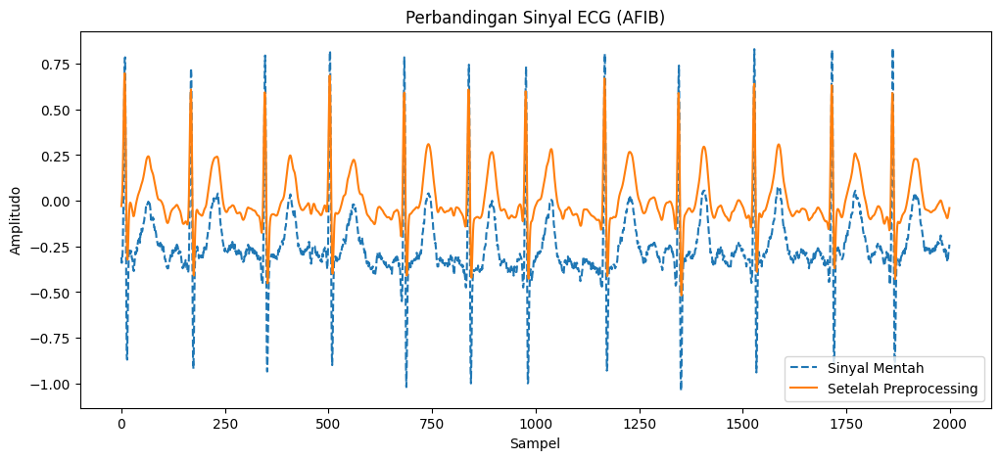

In [ ]:
# Visualisasi tiap cell tidak diubah
import pandas as pd
import matplotlib.pyplot as plt

# Plotting AFIB sample
ecg_signal_1 = pd.read_csv(f'{path}/af-database/Latest/AFIB/7.csv')
ecg_signal_2 = pd.read_csv(f'{path}/af-database/Latest/AFIB/Processed/7.csv')

signal_1 = ecg_signal_1['0'].values[:2000]
signal_2 = ecg_signal_2['ECG'].values[:2000]

plt.figure(figsize=(12, 5))
plt.plot(signal_1, linestyle='--', label='Sinyal Mentah')
plt.plot(signal_2, label='Setelah Preprocessing')
plt.title('Perbandingan Sinyal ECG (AFIB)')
plt.xlabel('Sampel')
plt.ylabel('Amplitudo')
plt.legend()
plt.show()

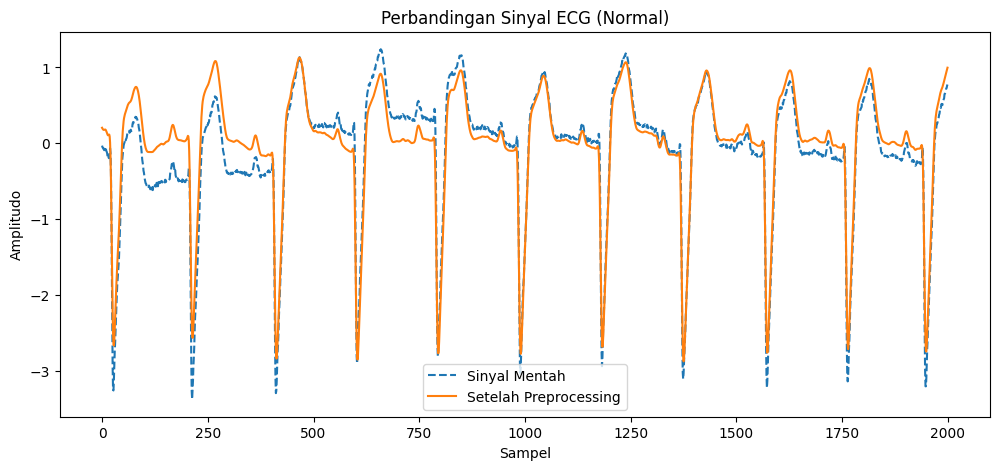

In [ ]:
# Plotting Normal sample
ecg_signal_1 = pd.read_csv(f'{path}/af-database/Latest/Normal/28.csv')
ecg_signal_2 = pd.read_csv(f'{path}/af-database/Latest/Normal/Processed/28.csv')

signal_1 = ecg_signal_1['0'].values[:2000]
signal_2 = ecg_signal_2['ECG'].values[:2000]

plt.figure(figsize=(12, 5))
plt.plot(signal_1, linestyle='--', label='Sinyal Mentah')
plt.plot(signal_2, label='Setelah Preprocessing')
plt.title('Perbandingan Sinyal ECG (Normal)')
plt.xlabel('Sampel')
plt.ylabel('Amplitudo')
plt.legend()
plt.show()

# PQRST View

In [ ]:
# Load satu segmen dan preprocess
df = pd.read_csv(f'{path}/af-database/Latest/Normal/Processed/62.csv')
ecg = df['ECG'].values
sr = 250  # sampling rate
segment = ecg[:sr*10]  # ambil 10 detik pertama

In [ ]:
# Bersihkan dan deteksi R-peaks
cleaned = nk.ecg_clean(segment, sampling_rate=sr, method='neurokit')
rpeaks_info = nk.ecg_findpeaks(cleaned, sampling_rate=sr)
rpeaks = np.array(rpeaks_info['ECG_R_Peaks'])

In [ ]:
# Delineasi gelombang P-Q-S-T
_, info = nk.ecg_delineate(cleaned, rpeaks, sampling_rate=sr, method='peak')

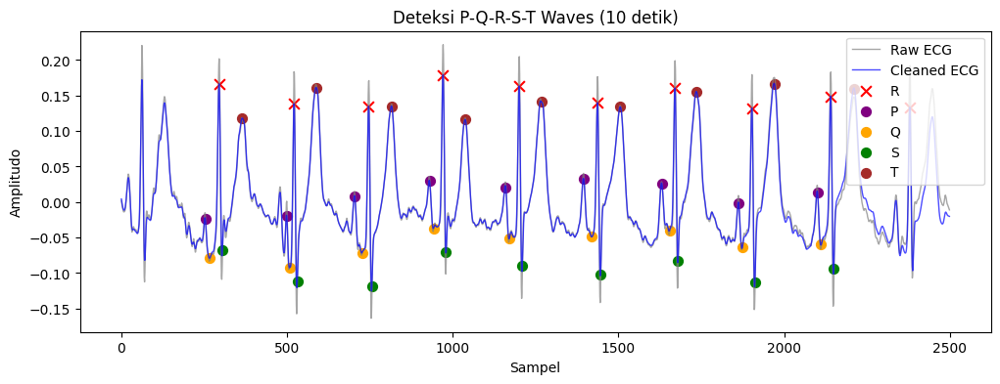

In [ ]:
plt.figure(figsize=(12,4))
# Plot raw dan cleaned ECG
plt.plot(segment, color='gray', alpha=0.7, linewidth=1, label='Raw ECG')
plt.plot(cleaned, color='blue', alpha=0.7, linewidth=1, label='Cleaned ECG')

# Plot R-peaks
plt.scatter(rpeaks, cleaned[rpeaks], color='red', s=60, marker='x', label='R')

# Plot P, Q, S, T peaks
for wave, color in zip(['ECG_P_Peaks','ECG_Q_Peaks','ECG_S_Peaks','ECG_T_Peaks'], ['purple','orange','green','brown']):
    idxs = info.get(wave, [])
    idxs = [int(i) for i in idxs if isinstance(i,(int,np.integer)) and 0<=i<len(cleaned)]
    if idxs:
        plt.scatter(idxs, cleaned[idxs], s=50, color=color, label=wave.split('_')[1])

plt.title('Deteksi P-Q-R-S-T Waves (10 detik)')
plt.xlabel('Sampel')
plt.ylabel('Amplitudo')
plt.legend(loc='upper right')
plt.show()

# Resume

In [ ]:
for folders in ['AFIB','Normal']:
    folder_path = f'{path}/af-database/Latest/{folders}/Processed'
    results = []

    for filename in os.listdir(folder_path):
        if not filename.endswith('.csv'):
            continue

        # Baca data dan bersihkan sinyal
        df  = pd.read_csv(os.path.join(folder_path, filename))
        ekg = df['ECG'].values
        sr  = 250
        cleaned = nk.ecg_clean(ekg, sampling_rate=sr, method="pantompkins1985")

        # Padding agar minimal 4 detik
        min_len = sr * 4
        if len(cleaned) < min_len:
            cleaned = np.pad(cleaned, (0, min_len - len(cleaned)), 'constant')

        # Deteksi R-peaks
        rpeaks_info = nk.ecg_findpeaks(cleaned, sampling_rate=sr)
        rpeaks = np.array(rpeaks_info.get('ECG_R_Peaks', []), dtype=int)

        # Hanya lakukan delineasi kalau ada minimal 1 peak
        if len(rpeaks) > 0:
            try:
                _, info = nk.ecg_delineate(cleaned,
                                          rpeaks,
                                          sampling_rate=sr,
                                          method='peak',
                                          check=False)
            except ValueError:
                # Kalau masih error (NaN durasi), skip dan set info kosong
                info = {}
        else:
            info = {}

        # Hitung RR interval jika ada minimal 2 peaks
        rr_ms = np.diff(rpeaks) / sr * 1000 if len(rpeaks) > 1 else np.array([np.nan])

        # Fungsi bantu untuk ekstrak peaks dan buang NaN
        def get_peaks(key):
            arr = np.array(info.get(key, []))
            return arr[np.isfinite(arr)].astype(int)

        q_peaks   = get_peaks('ECG_Q_Peaks')
        s_peaks   = get_peaks('ECG_S_Peaks')
        t_offsets = get_peaks('ECG_T_Offsets')

                # Hitung QT & QRS width dengan align panjang array
        # Tentukan panjang minimal atas pairing Q-T dan Q-S
        n_qt  = min(len(q_peaks), len(t_offsets))
        n_qrs = min(len(q_peaks), len(s_peaks))
        # Hitung QT (ms)
        if n_qt > 0:
            qt_ms = (t_offsets[:n_qt] - q_peaks[:n_qt]) / sr * 1000
        else:
            qt_ms = np.array([np.nan])
        # Hitung QRS width (ms)
        if n_qrs > 0:
            qrs_ms = (s_peaks[:n_qrs] - q_peaks[:n_qrs]) / sr * 1000
        else:
            qrs_ms = np.array([np.nan])

        # Kumpulkan statistik fitur, aman untuk NaN
        features = {
            'Min_RR'   : np.nanmin(rr_ms),
            'Max_RR'   : np.nanmax(rr_ms),
            'Mean_RR'  : np.nanmean(rr_ms),
            'Median_RR': np.nanmedian(rr_ms),
            'Std_RR'   : np.nanstd(rr_ms),
            'Min_QT'   : np.nanmin(qt_ms),
            'Max_QT'   : np.nanmax(qt_ms),
            'Mean_QT'  : np.nanmean(qt_ms),
            'Median_QT': np.nanmedian(qt_ms),
            'Std_QT'   : np.nanstd(qt_ms),
            'Min_QRS'   : np.nanmin(qrs_ms),
            'Max_QRS'   : np.nanmax(qrs_ms),
            'Mean_QRS'  : np.nanmean(qrs_ms),
            'Median_QRS': np.nanmedian(qrs_ms),
            'Std_QRS'   : np.nanstd(qrs_ms),
            'Label'     : '1' if folders=='AFIB' else '0'
        }
        results.append(features)

    # Simpan hasil per folder
    df_feat = pd.DataFrame(results)
    df_feat.to_csv(f'{path}/Fitur{folders}.csv', index=False)
    print(f"Hasil ekstraksi fitur {folders} telah disimpan!")

print('Selesai!')

/usr/local/lib/python3.11/dist-packages/neurokit2/signal/signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
<ipython-input-92-1997576327>:72: RuntimeWarning: All-NaN slice encountered
  'Min_QT'   : np.nanmin(qt_ms),
<ipython-input-92-1997576327>:73: RuntimeWarning: All-NaN slice encountered
  'Max_QT'   : np.nanmax(qt_ms),
<ipython-input-92-1997576327>:74: RuntimeWarning: Mean of empty slice
  'Mean_QT'  : np.nanmean(qt_ms),
<ipython-input-92-1997576327>:75: RuntimeWarning: All-NaN slice encountered
  'Median_QT': np.nanmedian(qt_ms),
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-92-1997576327>:77: RuntimeWarning: All-NaN slice encountered
  'Min_QRS'   : np.nanmin(qrs_ms),
<ipython-input-92-1997576327>:78: RuntimeWarning: All-NaN slice encountered
  'Max_QRS'   : n

Hasil ekstraksi fitur AFIB telah disimpan!
Hasil ekstraksi fitur Normal telah disimpan!
Selesai!


In [ ]:
# Tampilkan head dari FiturAFIB dan FiturNormal
print(pd.read_csv(f'{path}/FiturAFIB.csv').head())
print(pd.read_csv(f'{path}/FiturNormal.csv').head())

   Min_RR  Max_RR     Mean_RR  Median_RR      Std_RR  Min_QT  Max_QT  \
0   308.0   912.0  458.122449      436.0  111.665493 -1992.0   376.0   
1   520.0   552.0  536.000000      536.0   16.000000     NaN     NaN   
2   308.0  1004.0  464.013937      448.0  109.734935 -6924.0   308.0   
3   304.0   720.0  452.000000      440.0   99.512659  -452.0    40.0   
4   352.0   692.0  454.444444      460.0   67.483514 -2156.0   -88.0   

       Mean_QT  Median_QT       Std_QT  Min_QRS  Max_QRS     Mean_QRS  \
0  -723.020979     -904.0   635.782998  -2108.0    176.0  -858.013986   
1          NaN        NaN          NaN      NaN      NaN          NaN   
2 -4434.294118    -4544.0  1651.084680  -7024.0    136.0 -4572.205882   
3  -229.666667     -218.0   111.504360   -580.0   -160.0  -357.000000   
4  -700.387097     -320.0   699.766859  -2260.0   -296.0  -833.677419   

   Median_QRS      Std_QRS  Label  
0     -1028.0   629.858259      1  
1         NaN          NaN      1  
2     -4688.0  1647.

# Test

In [ ]:
df_afib   = pd.read_csv(f'{path}/FiturAFIB.csv')
df_normal = pd.read_csv(f'{path}/FiturNormal.csv')
df_all = pd.concat([df_afib, df_normal], ignore_index=True)
df_all = df_all.sample(frac=1, random_state=42)  # shuffle
df_all.to_csv(f'{path}/af-database/Latest/Data_Latih.csv', index=False)

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Baca data
train_data = pd.read_csv(f'{path}/af-database/Latest/Data_Latih.csv')
X = train_data.iloc[:, :-1].values
y = train_data.iloc[:, -1].values

# 1) Imputasi NaN dengan mean
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# 2) Standarisasi
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [ ]:
# Tambahan imports
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
import pandas as pd
import numpy as np
import time
import os
import joblib

# 1. Load data training
train_data = pd.read_csv(f'{path}/af-database/Latest/Data_Latih.csv')
X = train_data.iloc[:, :-1].values
y = train_data.iloc[:, -1].values

# 2. Imputasi nilai NaN (isi dengan mean kolom)
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# 3. Standarisasi fitur
scaler = StandardScaler()
X = scaler.fit_transform(X)

# (Opsional) Simpan scaler untuk digunakan di testing atau deployment
os.makedirs(f'{path}/Model/CNN_LSTM', exist_ok=True)
joblib.dump(scaler, f'{path}/Model/CNN_LSTM/scaler.pkl')

# 4. Siapkan K-Fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
results = []
start_time = time.time()

for fold_no, (train_idx, test_idx) in enumerate(kf.split(X), 1):
    # Split fold
    X_train, X_test_fold = X[train_idx], X[test_idx]
    y_train, y_test_fold = y[train_idx], y[test_idx]

    # 5. Atasi imbalance dengan SMOTE
    sm = SMOTE(random_state=42)
    X_res, y_res = sm.fit_resample(X_train, y_train)

    # 6. Bentuk ulang untuk CNN-LSTM: (n_samples, timesteps, 1)
    X_res = X_res.reshape((X_res.shape[0], X_res.shape[1], 1))
    X_test_fold = X_test_fold.reshape((X_test_fold.shape[0], X_test_fold.shape[1], 1))

    # 7. One-hot encoding label
    y_res_cat   = to_categorical(y_res, num_classes=2)
    y_test_cat  = to_categorical(y_test_fold, num_classes=2)

    # 8. Definisi model
    model = Sequential([
        Conv1D(32, kernel_size=3, activation='relu', input_shape=(X_res.shape[1], 1)),
        MaxPooling1D(pool_size=2),
        LSTM(64),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(2, activation='softmax')
    ])
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # 9. Training
    model.fit(X_res, y_res_cat, epochs=100, batch_size=64, verbose=1)

    # 10. Simpan model
    save_dir = f'{path}/Model/CNN_LSTM/Default'
    os.makedirs(save_dir, exist_ok=True)
    model.save(f'{save_dir}/CNN_LSTM_Default_{fold_no}.h5')

    # 11. Evaluasi pada fold test
    y_pred_prob = model.predict(X_test_fold)
    y_pred      = np.argmax(y_pred_prob, axis=1)

    TP = np.sum((y_pred == 1) & (y_test_fold == 1))
    TN = np.sum((y_pred == 0) & (y_test_fold == 0))
    FP = np.sum((y_pred == 1) & (y_test_fold == 0))
    FN = np.sum((y_pred == 0) & (y_test_fold == 1))

    acc  = np.mean(y_pred == y_test_fold)
    sens = TP / (TP + FN) if (TP + FN) > 0 else 0
    spec = TN / (TN + FP) if (TN + FP) > 0 else 0
    prec = TP / (TP + FP) if (TP + FP) > 0 else 0
    f1   = 2 * (prec * sens) / (prec + sens) if (prec + sens) > 0 else 0

    results.append({
        'Fold': fold_no,
        'Akurasi':    acc    * 100,
        'Sensitivitas': sens * 100,
        'Spesifisitas':  spec * 100,
        'F1 Score':     f1   * 100
    })

# 12. Tampilkan hasil K-Fold
elapsed = (time.time() - start_time) * 1000
df_results = pd.DataFrame(results)
print("\nHasil Akhir K-Fold:")
print(df_results)
print(f"Lama Waktu Training : {elapsed:.2f} ms")


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.4870 - loss: 0.6923
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.6249 - loss: 0.6810
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.6819 - loss: 0.6669
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7147 - loss: 0.6505
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6729 - loss: 0.6475
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6674 - loss: 0.6121
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6747 - loss: 0.6037
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7253 - loss: 0.5565
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6924 - loss: 0.5395
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7205 - loss: 0.4872
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7552 - loss: 0.4609
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7989 - lo

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.4492 - loss: 0.6988
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5967 - loss: 0.6859
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6548 - loss: 0.6770
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6561 - loss: 0.6658
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6913 - loss: 0.6482
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6883 - loss: 0.6342
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6886 - loss: 0.5962
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6677 - loss: 0.5962
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7486 - loss: 0.5409
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7240 - loss: 0.5093
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7432 - loss: 0.5003
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7559 - loss: 0.4970
E

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5415 - loss: 0.6911
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6886 - loss: 0.6713
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7012 - loss: 0.6485
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.6410 - loss: 0.6311
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6460 - loss: 0.5995
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.6815 - loss: 0.5887
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6781 - loss: 0.5635
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7000 - loss: 0.5294
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7569 - loss: 0.4961
Epoch 10/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7629 - loss: 0.4368
Epoch 11/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7879 - loss: 0.4247
Epoch 12/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.7867 - loss: 0.3942
E

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5912 - loss: 0.6891
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6464 - loss: 0.6746
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6428 - loss: 0.6609
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6154 - loss: 0.6487
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6357 - loss: 0.6313
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6688 - loss: 0.6042
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7293 - loss: 0.5594
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7284 - loss: 0.5263
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7523 - loss: 0.4868
Epoch 10/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7607 - loss: 0.4561
Epoch 11/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7583 - loss: 0.4551
Epoch 12/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7902 - loss: 0.4300
E

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5032 - loss: 0.6915
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6665 - loss: 0.6761
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6836 - loss: 0.6623
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.6935 - loss: 0.6400
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6702 - loss: 0.6219
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6604 - loss: 0.6111
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6558 - loss: 0.6065
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6827 - loss: 0.5687
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6990 - loss: 0.5429
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7280 - loss: 0.5229
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7303 - loss: 0.4872
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7231 - loss: 0.4829
E

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step

Hasil Akhir K-Fold:
   Fold    Akurasi  Sensitivitas  Spesifisitas   F1 Score
0     1  95.535714     96.825397     93.877551  96.062992
1     2  88.288288     82.258065     95.918367  88.695652
2     3  91.891892     92.000000     91.803279  91.089109
3     4  94.594595    100.000000     90.322581  94.230769
4     5  93.693694     94.915254     92.307692  94.117647
Lama Waktu Training : 102160.50 ms


# Continue

In [ ]:
from sklearn.model_selection import train_test_split
import pandas as pd

# 1. Baca file fitur yang sudah dibuat
df_afib   = pd.read_csv(f'{path}/FiturAFIB.csv')
df_normal = pd.read_csv(f'{path}/FiturNormal.csv')

# 2. Tambahkan label
df_afib  ['Label'] = 1
df_normal['Label'] = 0

# 3. Gabungkan dan acak
df_all = pd.concat([df_afib, df_normal], ignore_index=True)
df_all = df_all.sample(frac=1, random_state=42).reset_index(drop=True)

# 4. Buang NaN kalau ada (atau bisa juga diimputasi)
df_all = df_all.dropna().reset_index(drop=True)

# 5. Split ke training (80%) dan testing (20%), stratify supaya proporsi Label sama
df_train, df_test = train_test_split(
    df_all,
    test_size=0.2,
    stratify=df_all['Label'],
    random_state=42
)

# 6. Simpan ke CSV
df_train.to_csv(f'{path}/af-database/Latest/Datas/Data_Latih.csv', index=False)
df_test .to_csv(f'{path}/af-database/Latest/Datas/Data_Uji.csv' , index=False)

print("Data_Latih.csv:", df_train.shape, "baris")
print("Data_Uji.csv:  ", df_test .shape, "baris")


Data_Latih.csv: (442, 16) baris
Data_Uji.csv:   (111, 16) baris


In [ ]:
# Tambahan imports
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
import pandas as pd
import numpy as np
import time
import os
import joblib

# 1. Load data training
train_data = pd.read_csv(f'{path}/af-database/Latest/Datas/Data_Latih.csv')
X = train_data.iloc[:, :-1].values
y = train_data.iloc[:, -1].values

# 2. Imputasi nilai NaN (isi dengan mean kolom)
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# 3. Standarisasi fitur
scaler = StandardScaler()
X = scaler.fit_transform(X)

# (Opsional) Simpan scaler untuk digunakan di testing atau deployment
os.makedirs(f'{path}/af-database/Latest/Model/CNN_LSTM', exist_ok=True)
joblib.dump(scaler, f'{path}/af-database/Latest/Model/CNN_LSTM/scaler.pkl')

# 4. Siapkan K-Fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
results = []
start_time = time.time()

for fold_no, (train_idx, test_idx) in enumerate(kf.split(X), 1):
    # Split fold
    X_train, X_test_fold = X[train_idx], X[test_idx]
    y_train, y_test_fold = y[train_idx], y[test_idx]

    # 5. Atasi imbalance dengan SMOTE
    sm = SMOTE(random_state=42)
    X_res, y_res = sm.fit_resample(X_train, y_train)

    # 6. Bentuk ulang untuk CNN-LSTM: (n_samples, timesteps, 1)
    X_res = X_res.reshape((X_res.shape[0], X_res.shape[1], 1))
    X_test_fold = X_test_fold.reshape((X_test_fold.shape[0], X_test_fold.shape[1], 1))

    # 7. One-hot encoding label
    y_res_cat   = to_categorical(y_res, num_classes=2)
    y_test_cat  = to_categorical(y_test_fold, num_classes=2)

    # 8. Definisi model
    model = Sequential([
        Conv1D(32, kernel_size=3, activation='relu', input_shape=(X_res.shape[1], 1)),
        MaxPooling1D(pool_size=2),
        LSTM(64),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(2, activation='softmax')
    ])
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # 9. Training
    model.fit(X_res, y_res_cat, epochs=100, batch_size=64, verbose=1)

    # 10. Simpan model
    save_dir = f'{path}/af-database/Latest/Model/CNN_LSTM/Default'
    os.makedirs(save_dir, exist_ok=True)
    model.save(f'{save_dir}/CNN_LSTM_Default_{fold_no}.h5')

    # 11. Evaluasi pada fold test
    y_pred_prob = model.predict(X_test_fold)
    y_pred      = np.argmax(y_pred_prob, axis=1)

    TP = np.sum((y_pred == 1) & (y_test_fold == 1))
    TN = np.sum((y_pred == 0) & (y_test_fold == 0))
    FP = np.sum((y_pred == 1) & (y_test_fold == 0))
    FN = np.sum((y_pred == 0) & (y_test_fold == 1))

    acc  = np.mean(y_pred == y_test_fold)
    sens = TP / (TP + FN) if (TP + FN) > 0 else 0
    spec = TN / (TN + FP) if (TN + FP) > 0 else 0
    prec = TP / (TP + FP) if (TP + FP) > 0 else 0
    f1   = 2 * (prec * sens) / (prec + sens) if (prec + sens) > 0 else 0

    results.append({
        'Fold': fold_no,
        'Akurasi':    acc    * 100,
        'Sensitivitas': sens * 100,
        'Spesifisitas':  spec * 100,
        'F1 Score':     f1   * 100
    })

# 12. Tampilkan hasil K-Fold
elapsed = (time.time() - start_time) * 1000
df_results = pd.DataFrame(results)
print("\nHasil Akhir K-Fold:")
print(df_results)
print(f"Lama Waktu Training : {elapsed:.2f} ms")

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5353 - loss: 0.6915
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6277 - loss: 0.6805
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.6569 - loss: 0.6716
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7170 - loss: 0.6505
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7088 - loss: 0.6378
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7353 - loss: 0.6229
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.7052 - loss: 0.6096
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7520 - loss: 0.5778
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7239 - loss: 0.5569
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7548 - loss: 0.4821
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7392 - loss: 0.4566
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7728 - loss: 0.4399
E

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5578 - loss: 0.6851
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6240 - loss: 0.6823
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6471 - loss: 0.6787
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6260 - loss: 0.6613
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6346 - loss: 0.6391
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6368 - loss: 0.6274
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6670 - loss: 0.6137
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6825 - loss: 0.5766
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7321 - loss: 0.5608
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7202 - loss: 0.5446
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7700 - loss: 0.4988
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7533 - loss: 0.4580
E

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.5465 - loss: 0.6897
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6790 - loss: 0.6812
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6967 - loss: 0.6740
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6913 - loss: 0.6482
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6525 - loss: 0.6228
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6611 - loss: 0.6076
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.6581 - loss: 0.5958
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.6740 - loss: 0.5661
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7243 - loss: 0.5229
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7355 - loss: 0.5089
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7259 - loss: 0.4942
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7668 - loss: 0.4585
E

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.4810 - loss: 0.6960
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.6224 - loss: 0.6825
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6364 - loss: 0.6737
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6413 - loss: 0.6659
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6410 - loss: 0.6495
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6291 - loss: 0.6385
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.6327 - loss: 0.6225
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.7129 - loss: 0.5876
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.6879 - loss: 0.5795
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7175 - loss: 0.5502
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7055 - loss: 0.5355
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7294 - loss: 0.5124
E

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5668 - loss: 0.6929
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6287 - loss: 0.6785
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6885 - loss: 0.6689
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7008 - loss: 0.6550
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6742 - loss: 0.6407
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6777 - loss: 0.6173
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6703 - loss: 0.6384
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6713 - loss: 0.5789
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7131 - loss: 0.5645
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6630 - loss: 0.5423
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7517 - loss: 0.5144
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7287 - loss: 0.5002
E

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step

Hasil Akhir K-Fold:
   Fold    Akurasi  Sensitivitas  Spesifisitas   F1 Score
0     1  86.516854     86.046512     86.956522  86.046512
1     2  93.258427     93.023256     93.478261  93.023256
2     3  89.772727     90.697674     88.888889  89.655172
3     4  97.727273     97.959184     97.435897  97.959184
4     5  84.090909     86.956522     80.952381  85.106383
Lama Waktu Training : 96224.11 ms


In [ ]:
"""### Proses Testing"""
test_data = pd.read_csv(f'{path}/af-database/Latest/Datas/Data_Uji.csv')
start_time = time.time()
X_test2 = test_data.iloc[:, :-1].values
y_test2 = test_data.iloc[:, -1].values
X_test2 = scaler.transform(X_test2)
X_test2 = X_test2.reshape((X_test2.shape[0], X_test2.shape[1], 1))

results = []
for fold_no in range(1, 6):
    model = tf.keras.models.load_model(f'{path}/af-database/Latest/Model/CNN_LSTM/Default/CNN_LSTM_Default_{fold_no}.h5')
    y_pred_prob = model.predict(X_test2)
    y_pred = np.argmax(y_pred_prob, axis=1)
    TP = np.sum((y_pred == 1) & (y_test2 == 1))
    TN = np.sum((y_pred == 0) & (y_test2 == 0))
    FP = np.sum((y_pred == 1) & (y_test2 == 0))
    FN = np.sum((y_pred == 0) & (y_test2 == 1))

    acc = np.mean(y_pred == y_test2)
    sens = TP / (TP + FN) if (TP + FN) > 0 else 0
    spec = TN / (TN + FP) if (TN + FP) > 0 else 0
    prec = TP / (TP + FP) if (TP + FP) > 0 else 0
    f1 = 2 * (prec * sens) / (prec + sens) if (prec + sens) > 0 else 0

    results.append({
        'Fold': fold_no,
        'Akurasi': acc * 100,
        'Sensitivitas': sens * 100,
        'Spesifisitas': spec * 100,
        'F1 Score': f1 * 100
    })

end_time = time.time()
elapsed = (end_time - start_time) * 1000
hasil = pd.DataFrame(results)
print("\nHasil Akhir Testing:")
print(hasil)
print(f"Lama Waktu Testing : {elapsed:.2f} ms")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step

Hasil Akhir Testing:
   Fold    Akurasi  Sensitivitas  Spesifisitas   F1 Score
0     1  95.495495    100.000000     90.909091  95.726496
1     2  94.594595     96.428571     92.727273  94.736842
2     3  91.891892     94.642857     89.090909  92.173913
3     4  92.792793     94.642857     90.909091  92.982456
4     5  91.891892     94.642857     89.090909  92.173913
Lama Waktu Testing : 5949.44 ms


In [ ]:
# 0. Install Keras Tuner (sekali saja)
!pip install -q keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.6 MB/s eta 0:00:00


In [ ]:
# 1. Imports
import pandas as pd
import numpy as np
import os
import time

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

import keras_tuner as kt

# 2. Load & preprocess data
df = pd.read_csv(f'{path}/af-database/Latest/Datas/Data_Latih.csv')
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

# 2a. Imputasi NaN
imp = SimpleImputer(strategy='mean')
X = imp.fit_transform(X)

# 2b. Scaling
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Optional: simpan scaler
os.makedirs(f'{path}/af-database/Latest/Model/CNN_LSTM', exist_ok=True)
import joblib
joblib.dump(scaler, f'{path}/af-database/Latest/Model/CNN_LSTM/scaler.pkl')

# 2c. Atasi imbalance dengan SMOTE (sekali saja sebelum tuning)
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

# 2d. Reshape & one-hot
X_res = X_res.reshape((X_res.shape[0], X_res.shape[1], 1))
y_res_cat = to_categorical(y_res, num_classes=2)

# 3. Definisikan model builder untuk tuner
def build_model(hp):
    model = Sequential()
    # Conv1D
    model.add(Conv1D(
        filters=hp.Int('filters', 32, 128, step=32),
        kernel_size=hp.Choice('kernel_size', [3,5,7]),
        activation='relu',
        input_shape=(X_res.shape[1], 1)
    ))
    model.add(MaxPooling1D(
        pool_size=hp.Choice('pool_size', [2,4])
    ))
    # LSTM
    model.add(LSTM(
        units=hp.Int('lstm_units', 32, 256, step=32)
    ))
    # Dense + Dropout
    model.add(Dense(
        units=hp.Int('dense_units', 32, 256, step=32),
        activation='relu'
    ))
    model.add(Dropout(
        rate=hp.Float('dropout_rate', 0.1, 0.5, step=0.1)
    ))
    model.add(Dense(2, activation='softmax'))

    model.compile(
        optimizer=Adam(
            learning_rate=hp.Float('lr', 1e-4, 1e-2, sampling='log')
        ),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# 4. Inisialisasi tuner (Random Search)
tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=20,                 # coba 20 kombinasi
    executions_per_trial=1,
    directory='tuner_dir',
    project_name='cnn_lstm_tuning'
)

# 5. Jalankan pencarian hyperparameter
tuner.search(
    X_res, y_res_cat,
    epochs=100,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

# 6. Ambil hyperparameter terbaik
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("== Hyperparameter Terbaik ==")
print(f"Filters      : {best_hps.get('filters')}")
print(f"Kernel size  : {best_hps.get('kernel_size')}")
print(f"Pool size    : {best_hps.get('pool_size')}")
print(f"LSTM units   : {best_hps.get('lstm_units')}")
print(f"Dense units  : {best_hps.get('dense_units')}")
print(f"Dropout rate : {best_hps.get('dropout_rate'):.2f}")
print(f"Learning rate: {best_hps.get('lr'):.5f}")

# 7. Bangun model final dengan hyperparameter terbaik
model = tuner.hypermodel.build(best_hps)
start_time = time.time()
model.fit(X_res, y_res_cat, epochs=30, batch_size=32, verbose=1)  # bisa disesuaikan

# Simpan model final
os.makedirs(f'{path}/af-database/Latest/Model/CNN_LSTM/Best', exist_ok=True)
model.save(f'{path}/af-database/Latest/Model/CNN_LSTM/Best/CNN_LSTM_Best.h5')
print(f"Training selesai dalam {((time.time()-start_time)/60):.2f} menit.")


Trial 20 Complete [00h 00m 38s]
val_accuracy: 0.9444444179534912

Best val_accuracy So Far: 0.9666666388511658
Total elapsed time: 00h 14m 16s
== Hyperparameter Terbaik ==
Filters      : 32
Kernel size  : 7
Pool size    : 2
LSTM units   : 192
Dense units  : 224
Dropout rate : 0.50
Learning rate: 0.00569
Epoch 1/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.6378 - loss: 0.6433
Epoch 2/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.8691 - loss: 0.3507
Epoch 3/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9137 - loss: 0.2408
Epoch 4/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.9125 - loss: 0.2424
Epoch 5/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9285 - loss: 0.1736
Epoch 6/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.9226 - loss: 0.2155
Epoch 7/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.9268 - loss: 0.1856
Epoch 8/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.9489 - loss: 0.1606
Epoch 9/30
14/1

Training selesai dalam 0.21 menit.


In [ ]:
"""### Proses Testing Tuning"""
test_data = pd.read_csv(f'{path}/af-database/Latest/Datas/Data_Uji.csv')
start_time = time.time()
X_test2 = test_data.iloc[:, :-1].values
y_test2 = test_data.iloc[:, -1].values
X_test2 = scaler.transform(X_test2)
X_test2 = X_test2.reshape((X_test2.shape[0], X_test2.shape[1], 1))

results = []
for fold_no in range(1, 6):
    model = tf.keras.models.load_model(f'{path}/af-database/Latest/Model/CNN_LSTM/Default/CNN_LSTM_Default_{fold_no}.h5')
    y_pred_prob = model.predict(X_test2)
    y_pred = np.argmax(y_pred_prob, axis=1)
    TP = np.sum((y_pred == 1) & (y_test2 == 1))
    TN = np.sum((y_pred == 0) & (y_test2 == 0))
    FP = np.sum((y_pred == 1) & (y_test2 == 0))
    FN = np.sum((y_pred == 0) & (y_test2 == 1))

    acc = np.mean(y_pred == y_test2)
    sens = TP / (TP + FN) if (TP + FN) > 0 else 0
    spec = TN / (TN + FP) if (TN + FP) > 0 else 0
    prec = TP / (TP + FP) if (TP + FP) > 0 else 0
    f1 = 2 * (prec * sens) / (prec + sens) if (prec + sens) > 0 else 0

    results.append({
        'Fold': fold_no,
        'Akurasi': acc * 100,
        'Sensitivitas': sens * 100,
        'Spesifisitas': spec * 100,
        'F1 Score': f1 * 100
    })

end_time = time.time()
elapsed = (end_time - start_time) * 1000
hasil = pd.DataFrame(results)
print("\nHasil Akhir Testing (Tuning):")
print(hasil)
print(f"Lama Waktu Testing Tuning : {elapsed:.2f} ms")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 285ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step

Hasil Akhir Testing (Tuning):
   Fold    Akurasi  Sensitivitas  Spesifisitas   F1 Score
0     1  95.495495    100.000000     90.909091  95.726496
1     2  94.594595     96.428571     92.727273  94.736842
2     3  91.891892     94.642857     89.090909  92.173913
3     4  92.792793     94.642857     90.909091  92.982456
4     5  91.891892     94.642857     89.090909  92.173913
Lama Waktu Testing Tuning : 8157.43 ms


# TEST

In [ ]:
# AFDB specific parameters
SAMPLING_RATE = 250  # AFDB uses 250 Hz sampling rate
SEGMENT_LENGTH = 5000  # 20 seconds * 250 Hz (previously 7200 for 360Hz)
RECORD_NAMES = ['04015', '04043', '04048', '04126', '04746', '04908', '04936',
                '05091', '05121', '05261', '06426', '06453', '06995', '07162',
                '07859', '07879', '07910', '08215', '08219', '08378', '08405', '08434', '08455']

In [ ]:
def find_non_N_data(annotations, signal):
    """Identifikasi segment dengan aritmia dominan (bukan 'N' atau '+')"""
    data_signal = [None, None]

    # Filter hanya label aritmia yang relevan untuk AFDB
    arrhythmia_labels = ['AFIB', 'AFL', 'J', 'NOD', 'AB', 'VE', 'VFL', 'B']
    counts = Counter(label for label in annotations
                    if label in arrhythmia_labels and label not in ['N', '+'])

    if counts:
        most_common_label = max(counts, key=counts.get)
        data_signal[0] = most_common_label
        data_signal[1] = signal.flatten().tolist()
        return data_signal
    else:
        # Default to normal if no significant arrhythmia
        data_signal[0] = 'N'
        data_signal[1] = signal.flatten().tolist()
        return data_signal

In [ ]:
def calculate_rr_intervals(r_peak_times, sampling_rate):
    """Hitung interval RR dalam detik"""
    rr_intervals = []
    for i in range(1, len(r_peak_times)):
        rr_interval = (r_peak_times[i] - r_peak_times[i-1]) / sampling_rate
        rr_intervals.append(rr_interval)
    return rr_intervals

In [ ]:
def calculate_pr_intervals(p_peak_times, r_peak_times, sampling_rate):
    """Hitung interval PR dalam detik"""
    pr_intervals = []
    min_length = min(len(p_peak_times), len(r_peak_times))

    for i in range(min_length):
        pr_interval = (r_peak_times[i] - p_peak_times[i]) / sampling_rate
        pr_intervals.append(pr_interval)
    return pr_intervals

In [ ]:
def calculate_qt_intervals(q_peak_times, t_offset_times, sampling_rate):
    """Hitung interval QT dalam detik"""
    qt_intervals = []
    min_length = min(len(q_peak_times), len(t_offset_times))

    for i in range(min_length):
        qt_interval = (t_offset_times[i] - q_peak_times[i]) / sampling_rate
        qt_intervals.append(qt_interval)
    return qt_intervals

In [ ]:
def calculate_qrs_width(q_peaks, s_peaks, sampling_rate):
    """Hitung lebar QRS dalam detik"""
    qrs_widths = []
    min_length = min(len(q_peaks), len(s_peaks))

    for i in range(min_length):
        qrs_width = (s_peaks[i] - q_peaks[i]) / sampling_rate
        qrs_widths.append(qrs_width)
    return qrs_widths

In [ ]:
def remove_nan(data):
    """Hapus nilai NaN dari list"""
    return [x for x in data if not np.isnan(x) and not math.isnan(x)]

def calculate_statistics(data):
    """Hitung statistik deskriptif untuk fitur EKG"""
    cleaned_data = remove_nan(data)
    if not cleaned_data:
        return [None] * 6

    return [
        np.min(cleaned_data),
        np.max(cleaned_data),
        np.mean(cleaned_data),
        np.median(cleaned_data),
        skew(cleaned_data),
        kurtosis(cleaned_data)
    ]

In [ ]:
# Header untuk file CSV
header = [
    'Label', 'Min RR', 'Max RR', 'AVG RR', 'Median RR', 'Skew RR', 'Kurtosis RR',
    'Min PR', 'Max PR', 'AVG PR', 'Median PR', 'Skew PR', 'Kurtosis PR',
    'Min QT', 'Max QT', 'AVG QT', 'Median QT', 'Skew QT', 'Kurtosis QT',
    'Min QRS', 'Max QRS', 'AVG QRS', 'Median QRS', 'Skew QRS', 'Kurtosis QRS'
]

In [ ]:
def list_to_csv(data, filename):
    """Simpan data ke file CSV"""
    with open(filename, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(header)
        for row in data:
            writer.writerow(row)

In [ ]:
# Proses utama untuk setiap rekaman AFDB
for record_name in RECORD_NAMES:
    print(f"Processing record: {record_name}")

    # Path file AFDB
    record_path = f'/content/drive/MyDrive/Experiments/CardioSense/data/af-database/{record_name}'

    try:
        # Baca rekaman lengkap
        record = wfdb.rdrecord(record_path, channels=[0])
        total_samples = len(record.p_signal)

        # Inisialisasi variabel
        segments = []
        annotations = []
        data = []

        # Segmentasi sinyal
        for start_sample in range(0, total_samples, SEGMENT_LENGTH):
            end_sample = min(start_sample + SEGMENT_LENGTH, total_samples)

            # Baca segmen sinyal
            record_segment = wfdb.rdrecord(
                record_path,
                channels=[0],
                sampfrom=start_sample,
                sampto=end_sample
            )

            # Baca anotasi segmen
            annotation_segment = wfdb.rdann(
                record_path,
                extension='atr',
                sampfrom=start_sample,
                sampto=end_sample
            )

            segments.append(record_segment)
            annotations.append(annotation_segment)

        # Identifikasi aritmia dominan tiap segmen
        for i in range(len(segments)):
            result = find_non_N_data(annotations[i].symbol, segments[i].p_signal)
            data.append(result)

        list_data_ready_csv = []

        # Ekstraksi fitur untuk setiap segmen
        for i in range(len(data)):
            feature_and_label = [data[i][0]]
            ecg_signal = np.array(data[i][1])

            try:
                # Preprocessing dengan neurokit2 - TAHAP KRUSIAL
                signals, info = nk.ecg_process(
                    ecg_signal,
                    sampling_rate=SAMPLING_RATE,
                    method="neurokit"
                )

                # Deteksi fitur gelombang
                waves = nk.ecg_delineate(
                    signals['ECG_Clean'],
                    info['ECG_R_Peaks'],
                    sampling_rate=SAMPLING_RATE,
                    method="dwt",
                    show=False,
                    check=True
                )

                # Ekstraksi interval
                rr_intervals = calculate_rr_intervals(info['ECG_R_Peaks'], SAMPLING_RATE)
                pr_intervals = calculate_pr_intervals(
                    waves['ECG_P_Peaks'],
                    info['ECG_R_Peaks'],
                    SAMPLING_RATE
                )
                qt_intervals = calculate_qt_intervals(
                    waves['ECG_Q_Peaks'],
                    waves['ECG_T_Offsets'],
                    SAMPLING_RATE
                )
                qrs_widths = calculate_qrs_width(
                    waves['ECG_Q_Peaks'],
                    waves['ECG_S_Peaks'],
                    SAMPLING_RATE
                )

                # Hitung statistik untuk setiap fitur
                feature_and_label.extend(calculate_statistics(rr_intervals))
                feature_and_label.extend(calculate_statistics(pr_intervals))
                feature_and_label.extend(calculate_statistics(qt_intervals))
                feature_and_label.extend(calculate_statistics(qrs_widths))

                list_data_ready_csv.append(feature_and_label)

            except Exception as e:
                print(f"Error processing segment {i}: {str(e)}")
                # Tambahkan placeholder jika terjadi error
                list_data_ready_csv.append([data[i][0]] + [None]*(len(header)-1))

        # Simpan hasil ekstraksi fitur
        output_path = f'/content/drive/MyDrive/Experiments/CardioSense/data/af-database/XtractLatest/{record_name}_features.csv'
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
        list_to_csv(list_data_ready_csv, output_path)
        print(f"Saved features for {record_name} to {output_path}")

    except Exception as e:
        print(f"Error processing record {record_name}: {str(e)}")

Processing record: 04015


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 0: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 1: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 2: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 3: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 4: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 5: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 6: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 7: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 8: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 9: tuple indices must be integers or slices, not str
Error processing segment 10: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 11: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 12: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 13: tuple indices must be integers or slices, not str
Error processing segment 14: tuple indices must be integers or slices, not str
Error processing segment 15: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 16: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 17: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 18: tuple indices must be integers or slices, not str
Error processing segment 19: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 20: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 21: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 22: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 23: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 24: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 25: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 26: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 27: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 28: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 29: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 30: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 31: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 32: tuple indices must be integers or slices, not str
Error processing segment 33: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 34: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 35: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 36: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 37: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 38: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 39: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 40: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 41: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 42: tuple indices must be integers or slices, not str
Error processing segment 43: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 44: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 45: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 46: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 47: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 48: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 49: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 50: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 51: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 52: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 53: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 54: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 55: tuple indices must be integers or slices, not str
Error processing segment 56: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 57: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 58: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 59: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 60: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 61: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 62: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 63: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 64: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 65: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 66: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 67: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 68: tuple indices must be integers or slices, not str
Error processing segment 69: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 70: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 71: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 72: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 73: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 74: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 75: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 76: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 77: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 78: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 79: tuple indices must be integers or slices, not str
Error processing segment 80: tuple indices must be integers or slices, not str
Error processing segment 81: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 82: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 83: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 84: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 85: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 86: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 87: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 88: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 89: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 90: tuple indices must be integers or slices, not str
Error processing segment 91: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 92: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 93: tuple indices must be integers or slices, not str
Error processing segment 94: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 95: tuple indices must be integers or slices, not str
Error processing segment 96: tuple indices must be integers or slices, not str
Error processing segment 97: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 98: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 99: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 100: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 101: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 102: tuple indices must be integers or slices, not str
Error processing segment 103: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 104: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 105: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 106: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 107: tuple indices must be integers or slices, not str
Error processing segment 108: tuple indices must be integers or slices, not str
Error processing segment 109: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 110: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 111: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 112: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 113: tuple indices must be integers or slices, not str
Error processing segment 114: tuple indices must be integers or slices, not str
Error processing segment 115: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 116: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 117: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 118: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 119: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 120: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 121: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 122: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 123: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 124: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 125: tuple indices must be integers or slices, not str
Error processing segment 126: tuple indices must be integers or slices, not str
Error processing segment 127: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 128: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 129: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 130: tuple indices must be integers or slices, not str
Error processing segment 131: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 132: tuple indices must be integers or slices, not str
Error processing segment 133: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 134: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 135: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 136: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 137: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 138: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 139: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 140: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 141: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 142: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 143: tuple indices must be integers or slices, not str
Error processing segment 144: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 145: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 146: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 147: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 148: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 149: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 150: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 151: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 152: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 153: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 154: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 155: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 156: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 157: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 158: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 159: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 160: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 161: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 162: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 163: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 164: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 165: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 166: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 167: tuple indices must be integers or slices, not str
Error processing segment 168: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 169: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 170: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 171: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 172: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 173: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 174: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 175: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 176: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 177: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 178: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 179: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 180: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 181: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 182: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 183: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 184: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 185: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 186: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 187: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 188: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 189: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 190: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 191: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 192: tuple indices must be integers or slices, not str
Error processing segment 193: tuple indices must be integers or slices, not str
Error processing segment 194: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 195: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 196: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 197: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 198: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 199: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 200: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 201: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 202: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 203: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 204: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 205: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 206: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 207: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 208: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 209: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 210: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 211: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 212: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 213: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 214: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 215: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 216: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 217: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 218: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 219: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 220: tuple indices must be integers or slices, not str
Error processing segment 221: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 222: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 223: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 224: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 225: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 226: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 227: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 228: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 229: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 230: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 231: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 232: tuple indices must be integers or slices, not str
Error processing segment 233: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 234: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 235: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 236: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 237: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 238: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 239: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 240: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 241: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 242: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 243: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 244: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 245: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 246: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 247: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 248: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 249: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 250: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 251: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 252: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 253: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 254: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 255: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 256: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 257: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 258: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 259: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 260: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 261: tuple indices must be integers or slices, not str
Error processing segment 262: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 263: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 264: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 265: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 266: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 267: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 268: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 269: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 270: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 271: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 272: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 273: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 274: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 275: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 276: tuple indices must be integers or slices, not str
Error processing segment 277: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 278: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 279: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 280: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 281: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 282: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 283: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 284: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 285: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 286: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 287: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 288: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 289: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 290: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 291: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 292: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 293: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 294: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 295: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 296: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 297: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 298: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 299: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 300: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 301: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 302: tuple indices must be integers or slices, not str
Error processing segment 303: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 304: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 305: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 306: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 307: tuple indices must be integers or slices, not str
Error processing segment 308: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 309: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 310: tuple indices must be integers or slices, not str
Error processing segment 311: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 312: tuple indices must be integers or slices, not str
Error processing segment 313: tuple indices must be integers or slices, not str
Error processing segment 314: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 315: tuple indices must be integers or slices, not str
Error processing segment 316: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 317: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 318: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 319: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 320: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 321: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 322: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 323: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 324: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 325: tuple indices must be integers or slices, not str
Error processing segment 326: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 327: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 328: tuple indices must be integers or slices, not str
Error processing segment 329: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 330: tuple indices must be integers or slices, not str
Error processing segment 331: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 332: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 333: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 334: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 335: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 336: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 337: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 338: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 339: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 340: tuple indices must be integers or slices, not str
Error processing segment 341: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 342: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 343: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 344: tuple indices must be integers or slices, not str
Error processing segment 345: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 346: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 347: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 348: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 349: tuple indices must be integers or slices, not str
Error processing segment 350: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 351: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 352: tuple indices must be integers or slices, not str
Error processing segment 353: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 354: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 355: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 356: tuple indices must be integers or slices, not str
Error processing segment 357: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 358: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 359: tuple indices must be integers or slices, not str
Error processing segment 360: tuple indices must be integers or slices, not str
Error processing segment 361: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 362: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 363: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 364: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 365: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 366: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 367: tuple indices must be integers or slices, not str
Error processing segment 368: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 369: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 370: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 371: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 372: tuple indices must be integers or slices, not str
Error processing segment 373: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 374: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 375: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 376: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 377: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 378: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 379: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 380: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 381: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 382: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 383: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 384: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 385: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 386: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 387: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 388: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 389: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 390: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 391: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 392: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 393: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 394: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 395: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 396: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 397: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 398: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 399: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 400: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 401: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 402: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 403: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 404: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 405: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 406: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 407: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 408: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 409: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 410: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 411: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 412: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 413: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 414: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 415: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 416: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 417: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 418: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 419: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 420: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 421: tuple indices must be integers or slices, not str
Error processing segment 422: tuple indices must be integers or slices, not str
Error processing segment 423: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 424: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 425: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 426: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 427: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 428: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 429: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 430: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 431: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 432: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 433: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 434: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 435: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 436: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 437: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 438: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 439: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 440: tuple indices must be integers or slices, not str
Error processing segment 441: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 442: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 443: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 444: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 445: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 446: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 447: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 448: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 449: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 450: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 451: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 452: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 453: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 454: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 455: tuple indices must be integers or slices, not str
Error processing segment 456: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 457: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 458: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 459: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 460: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 461: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 462: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 463: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 464: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 465: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 466: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 467: tuple indices must be integers or slices, not str
Error processing segment 468: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 469: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 470: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 471: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 472: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 473: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 474: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 475: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 476: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 477: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 478: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 479: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 480: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 481: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 482: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 483: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 484: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 485: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 486: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 487: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 488: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 489: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 490: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 491: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 492: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 493: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 494: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 495: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 496: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 497: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 498: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 499: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 500: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 501: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 502: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 503: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 504: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 505: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 506: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 507: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 508: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 509: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 510: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 511: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 512: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 513: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 514: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 515: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 516: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 517: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 518: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 519: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 520: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 521: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 522: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 523: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 524: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 525: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 526: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 527: tuple indices must be integers or slices, not str
Error processing segment 528: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 529: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 530: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 531: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 532: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 533: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 534: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 535: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 536: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 537: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 538: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 539: tuple indices must be integers or slices, not str
Error processing segment 540: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 541: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 542: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 543: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 544: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 545: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 546: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 547: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 548: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 549: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 550: tuple indices must be integers or slices, not str
Error processing segment 551: tuple indices must be integers or slices, not str
Error processing segment 552: tuple indices must be integers or slices, not str
Error processing segment 553: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 554: tuple indices must be integers or slices, not str
Error processing segment 555: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 556: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 557: tuple indices must be integers or slices, not str
Error processing segment 558: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 559: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 560: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 561: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 562: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 563: tuple indices must be integers or slices, not str
Error processing segment 564: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 565: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 566: tuple indices must be integers or slices, not str
Error processing segment 567: tuple indices must be integers or slices, not str
Error processing segment 568: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 569: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 570: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 571: tuple indices must be integers or slices, not str
Error processing segment 572: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 573: tuple indices must be integers or slices, not str
Error processing segment 574: tuple indices must be integers or slices, not str
Error processing segment 575: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 576: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 577: tuple indices must be integers or slices, not str
Error processing segment 578: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 579: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 580: tuple indices must be integers or slices, not str
Error processing segment 581: tuple indices must be integers or slices, not str
Error processing segment 582: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 583: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 584: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 585: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 586: tuple indices must be integers or slices, not str
Error processing segment 587: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 588: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 589: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 590: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 591: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 592: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 593: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 594: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 595: tuple indices must be integers or slices, not str
Error processing segment 596: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 597: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 598: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 599: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 600: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 601: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 602: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 603: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 604: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 605: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 606: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 607: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 608: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 609: tuple indices must be integers or slices, not str
Error processing segment 610: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 611: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 612: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 613: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 614: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 615: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 616: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 617: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 618: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 619: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 620: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 621: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 622: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 623: tuple indices must be integers or slices, not str
Error processing segment 624: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 625: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 626: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 627: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 628: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 629: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 630: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 631: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 632: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 633: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 634: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 635: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 636: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 637: tuple indices must be integers or slices, not str
Error processing segment 638: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 639: tuple indices must be integers or slices, not str
Error processing segment 640: tuple indices must be integers or slices, not str
Error processing segment 641: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 642: tuple indices must be integers or slices, not str
Error processing segment 643: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 644: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 645: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 646: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 647: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 648: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 649: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 650: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 651: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 652: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 653: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 654: tuple indices must be integers or slices, not str
Error processing segment 655: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 656: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 657: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 658: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 659: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 660: tuple indices must be integers or slices, not str
Error processing segment 661: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 662: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 663: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 664: tuple indices must be integers or slices, not str
Error processing segment 665: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 666: tuple indices must be integers or slices, not str
Error processing segment 667: tuple indices must be integers or slices, not str
Error processing segment 668: tuple indices must be integers or slices, not str
Error processing segment 669: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 670: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 671: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 672: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 673: tuple indices must be integers or slices, not str
Error processing segment 674: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 675: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 676: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 677: tuple indices must be integers or slices, not str
Error processing segment 678: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 679: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 680: tuple indices must be integers or slices, not str
Error processing segment 681: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 682: tuple indices must be integers or slices, not str
Error processing segment 683: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 684: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 685: tuple indices must be integers or slices, not str
Error processing segment 686: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 687: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 688: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 689: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 690: tuple indices must be integers or slices, not str
Error processing segment 691: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 692: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 693: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 694: tuple indices must be integers or slices, not str
Error processing segment 695: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 696: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 697: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 698: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 699: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 700: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 701: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 702: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 703: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 704: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 705: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 706: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 707: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 708: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 709: tuple indices must be integers or slices, not str
Error processing segment 710: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 711: tuple indices must be integers or slices, not str


/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[col][i] = np.nan
/usr/local/lib/python3.11/dist-packages/neurokit2/ecg/ecg_delineate.py:1438: SettingWithCopyWarnin

Error processing segment 712: tuple indices must be integers or slices, not str


KeyboardInterrupt: 

In [ ]:
record_names = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '111', '112', '113', '114', '115', '116', '117', '118', '119', '121', '122', '123', '124', '200', '201', '202', '203', '205', '207', '208', '209', '210', '212', '213', '214', '215', '217', '219', '220', '221', '222', '223', '228', '230', '231', '232', '233', '234']

dfs = []

for record_name in record_names:
    df = pd.read_csv(f'/content/drive/MyDrive/Experiments/mitbih-database/Xtract/{record_name}_new.csv')
    dfs.append(df)

    # unique_labels = df.iloc[:, -1].unique()
    # print(record_name, unique_labels)

# Gabungkan DataFrame menjadi satu DataFrame tunggal
combined_df = pd.concat(dfs, ignore_index=True)
combined_df = combined_df[~combined_df['Label'].str.contains('[\+Q!EJf\"~a]')]

# Cetak hasilnya
print(combined_df)

     Label  Min RR  Max RR      AVG RR  Median RR   Skew RR  Kurtosis RR  \
0        A     277     312  292.875000      293.0  0.555820    -0.786994   
1        N     277     317  292.956522      293.0  0.449398    -0.381171   
2        N     280     308  291.708333      291.5  0.296262    -1.083795   
3        N     278     309  291.583333      292.0  0.110841    -0.923631   
4        N     277     309  292.260870      292.0  0.273736    -0.718981   
...    ...     ...     ...         ...        ...       ...          ...   
4361     N     227     252  240.965517      242.0 -0.365798    -0.778002   
4362     N     227     252  238.379310      238.0  0.333539    -0.338404   
4363     N     229     251  242.586207      243.0 -0.817607     0.006916   
4364     N     235     250  242.500000      242.0 -0.049041    -0.785062   
4365     N     235     252  243.000000      243.0  0.244936    -0.260052   

      Min PR  Max PR      AVG PR  ...     AVG QT  Median QT   Skew QT  \
0         37  

In [ ]:
combined_df

,Label,Min RR,Max RR,AVG RR,Median RR,Skew RR,Kurtosis RR,Min PR,Max PR,AVG PR,...,AVG QT,Median QT,Skew QT,Kurtosis QT,Min QRS,Max QRS,AVG QRS,Median QRS,Skew QRS,Kurtosis QRS
0,A,277,312,292.875000,293.0,0.555820,-0.786994,37,66,56.333333,...,76.391304,75.0,0.881517,2.624342,0.038889,0.122222,0.048727,0.044444,3.798705,14.072691
1,N,277,317,292.956522,293.0,0.449398,-0.381171,48,67,58.000000,...,78.956522,79.0,0.143966,-1.371884,0.036111,0.055556,0.045411,0.044444,0.491797,0.684149
2,N,280,308,291.708333,291.5,0.296262,-1.083795,-253,-221,-236.000000,...,77.708333,78.5,-0.302546,-0.116642,0.041667,0.058333,0.045255,0.044444,1.386492,0.949580
3,N,278,309,291.583333,292.0,0.110841,-0.923631,47,66,54.280000,...,80.791667,80.5,0.625572,0.783684,0.041667,0.061111,0.045139,0.044444,1.822580,3.497428
4,N,277,309,292.260870,292.0,0.273736,-0.718981,48,67,56.083333,...,78.739130,78.0,0.837191,0.864628,0.038889,0.052778,0.045894,0.047222,0.046819,-1.223346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4361,N,227,252,240.965517,242.0,-0.365798,-0.778002,44,65,48.600000,...,79.275862,81.0,-0.402690,1.064934,0.052778,0.152778,0.062548,0.058333,4.078033,16.377926
4362,N,227,252,238.379310,238.0,0.333539,-0.338404,41,50,46.000000,...,79.448276,77.0,0.827372,-0.149767,0.050000,0.061111,0.056418,0.055556,-0.453809,-0.055608
4363,N,229,251,242.586207,243.0,-0.817607,0.006916,44,51,47.466667,...,84.551724,85.0,0.136649,-0.755347,0.050000,0.061111,0.056513,0.055556,0.081343,-0.747959
4364,N,235,250,242.500000,242.0,-0.049041,-0.785062,44,50,46.551724,...,88.178571,93.0,-0.735324,-1.090852,0.052778,0.063889,0.057837,0.058333,0.361578,-0.489431


In [ ]:
def comparitor_qrs(ann, peak, fs, sig):
    comparitor = processing.compare_annotations(ref_sample=ann.sample[1:],
                                            test_sample=peak,
                                            window_width=int(0.1 * fs),
                                            signal=sig)

    # Print and plot the results
    comparitor.print_summary()
    comparitor.plot(title='detected QRS vs reference annotations')

In [ ]:
classes = ['N', 'V', 'A', 'L', 'R', 'E', 'F', 'L', 'R', 'a', 'V', 'F', 'J']
input_size = 256

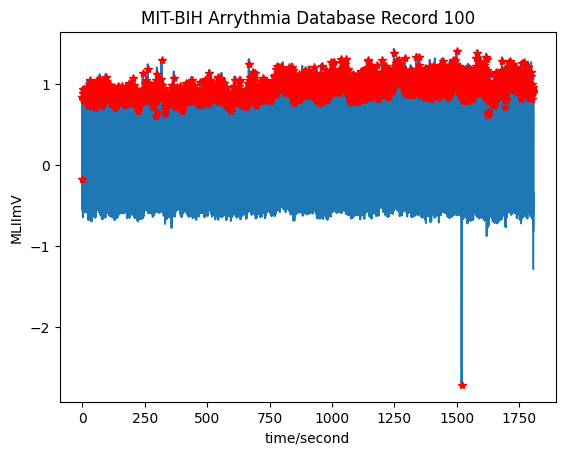

2273 reference annotations, 2273 test annotations

True Positives (matched samples): 2273
False Positives (unmatched test samples): 0
False Negatives (unmatched reference samples): 0

Sensitivity: 1.0000 (2273/2273)
Positive Predictivity: 1.0000 (2273/2273)


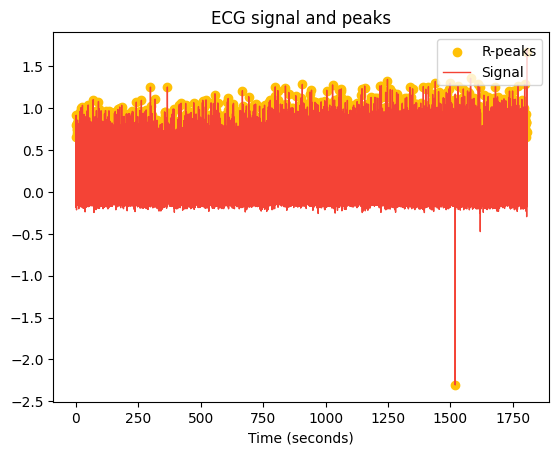

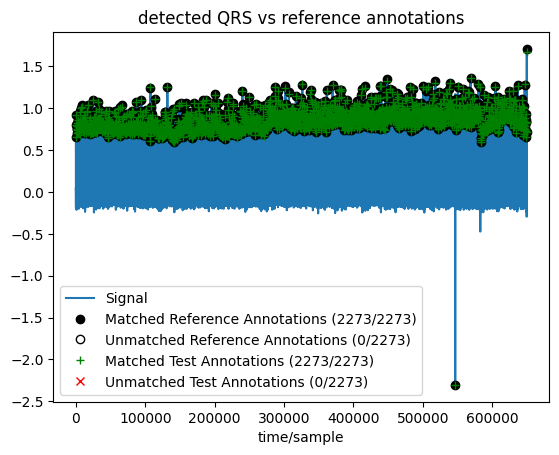

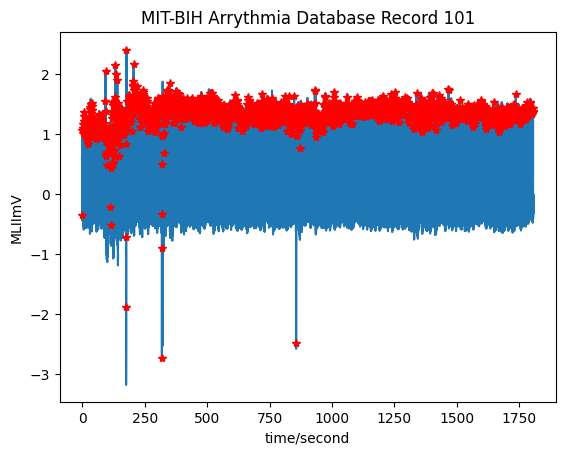

1873 reference annotations, 1867 test annotations

True Positives (matched samples): 1864
False Positives (unmatched test samples): 3
False Negatives (unmatched reference samples): 9

Sensitivity: 0.9952 (1864/1873)
Positive Predictivity: 0.9984 (1864/1867)


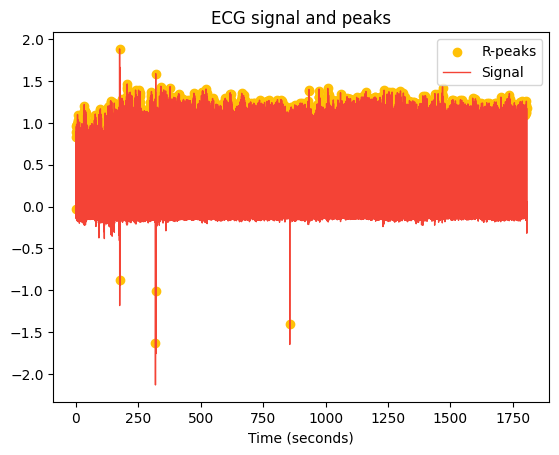

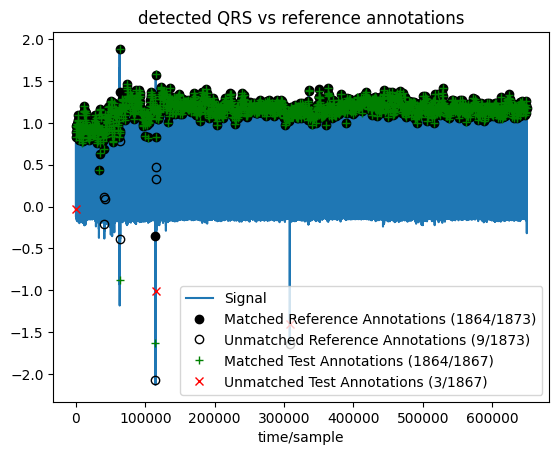

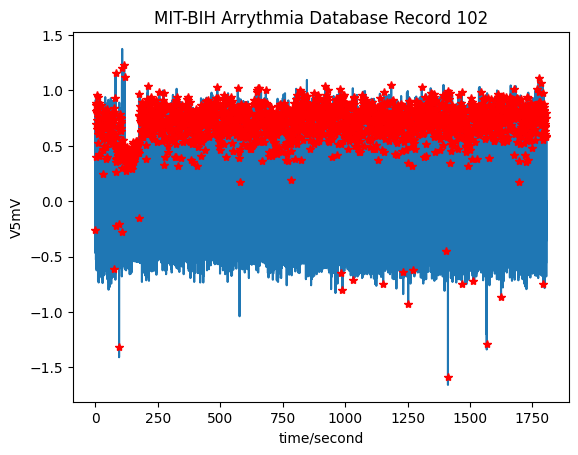

2191 reference annotations, 2188 test annotations

True Positives (matched samples): 2187
False Positives (unmatched test samples): 1
False Negatives (unmatched reference samples): 4

Sensitivity: 0.9982 (2187/2191)
Positive Predictivity: 0.9995 (2187/2188)


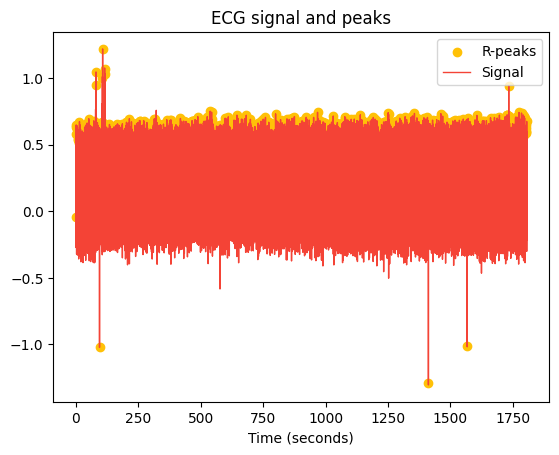

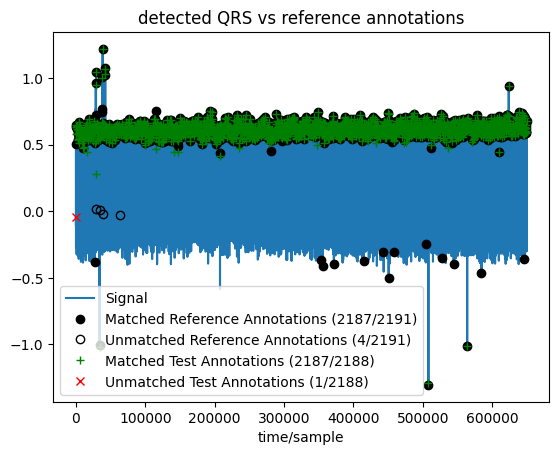

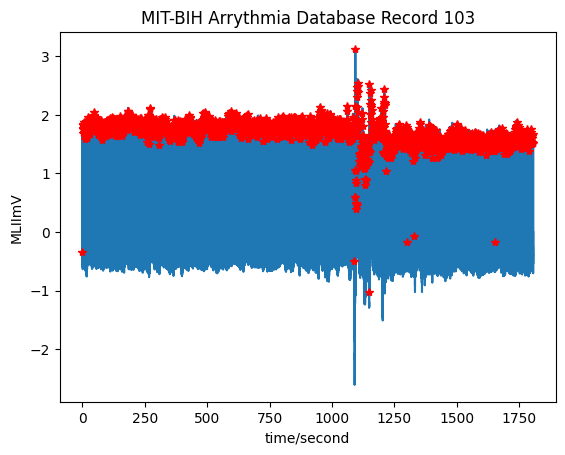

2090 reference annotations, 2085 test annotations

True Positives (matched samples): 2083
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 7

Sensitivity: 0.9967 (2083/2090)
Positive Predictivity: 0.9990 (2083/2085)


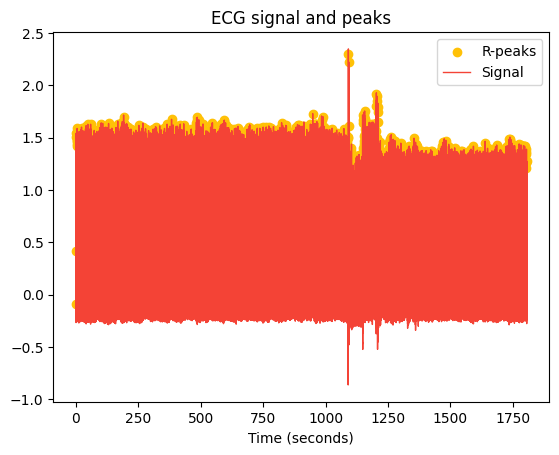

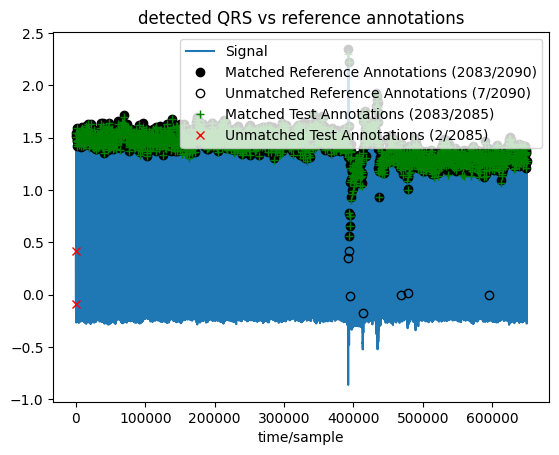

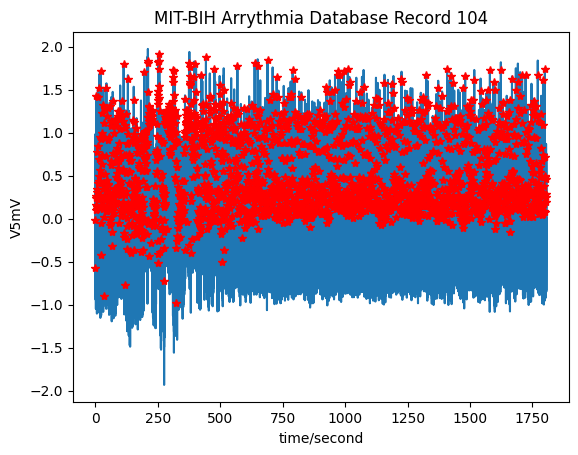

2310 reference annotations, 2244 test annotations

True Positives (matched samples): 2224
False Positives (unmatched test samples): 20
False Negatives (unmatched reference samples): 86

Sensitivity: 0.9628 (2224/2310)
Positive Predictivity: 0.9911 (2224/2244)


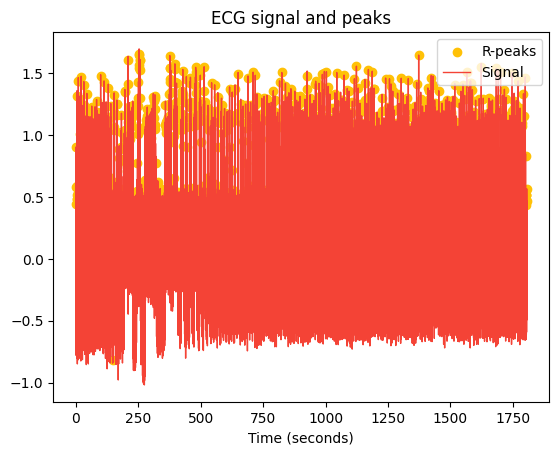

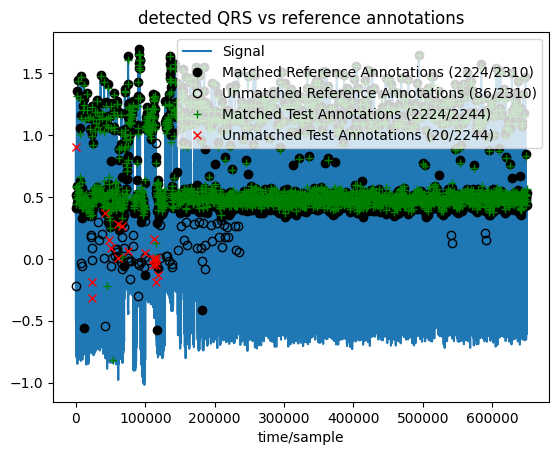

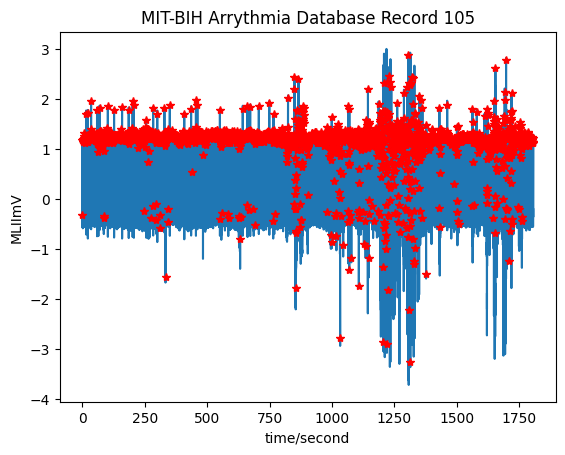

2690 reference annotations, 2586 test annotations

True Positives (matched samples): 2567
False Positives (unmatched test samples): 19
False Negatives (unmatched reference samples): 123

Sensitivity: 0.9543 (2567/2690)
Positive Predictivity: 0.9927 (2567/2586)


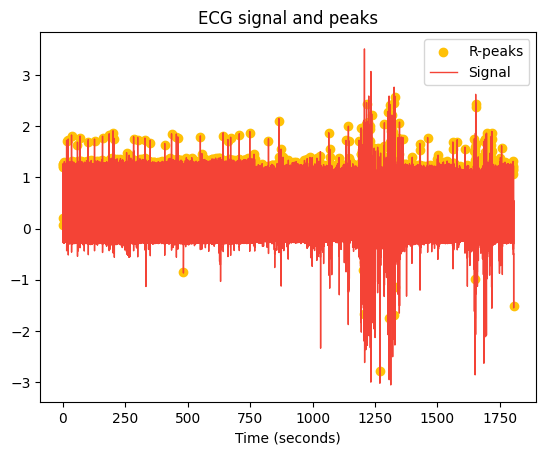

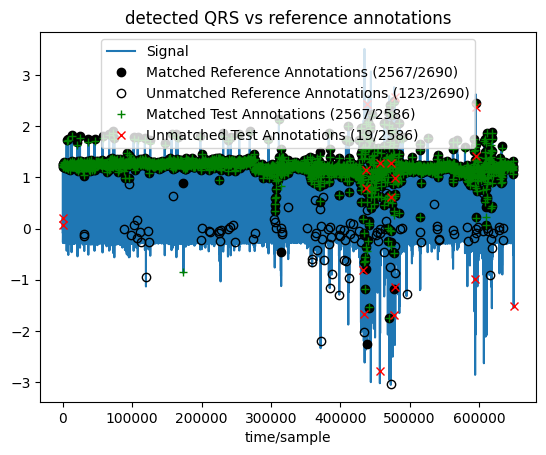

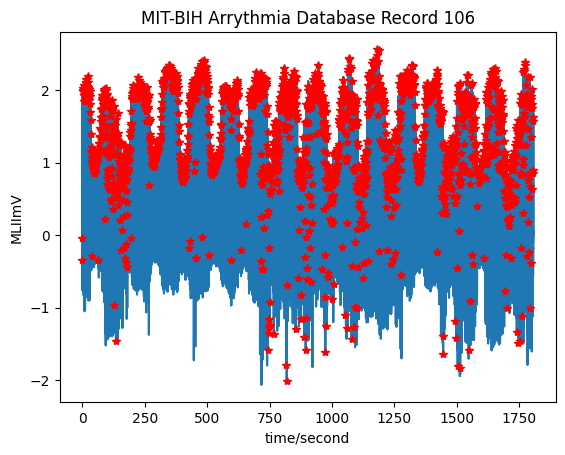

2097 reference annotations, 1861 test annotations

True Positives (matched samples): 1853
False Positives (unmatched test samples): 8
False Negatives (unmatched reference samples): 244

Sensitivity: 0.8836 (1853/2097)
Positive Predictivity: 0.9957 (1853/1861)


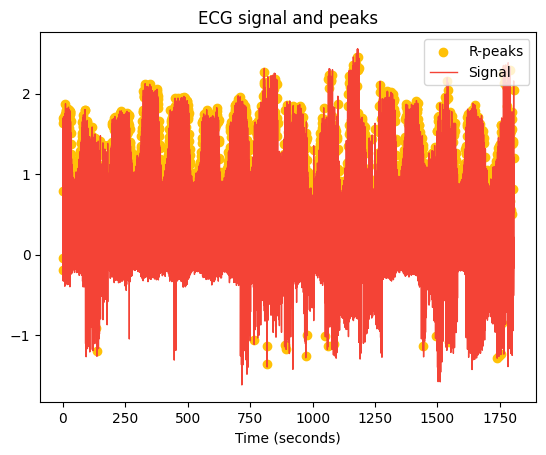

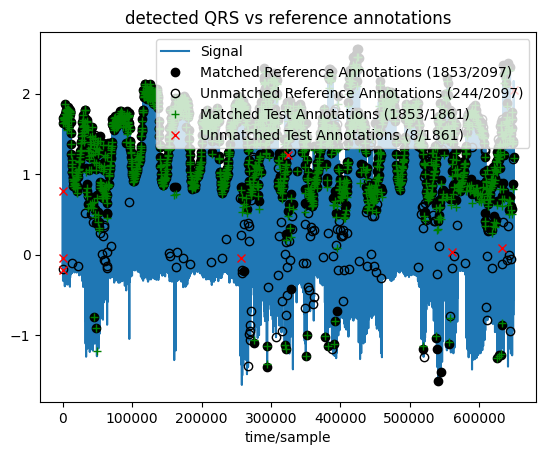

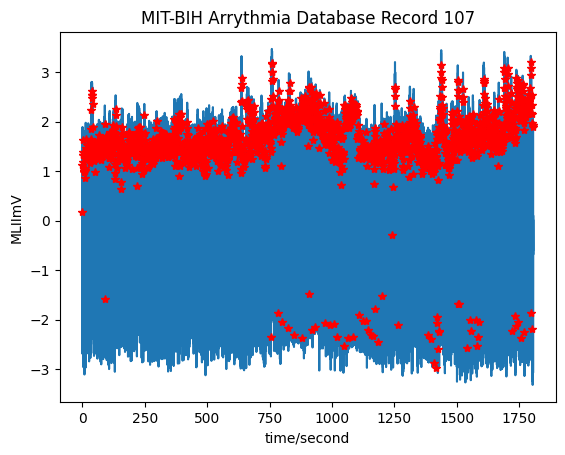

2139 reference annotations, 2137 test annotations

True Positives (matched samples): 2134
False Positives (unmatched test samples): 3
False Negatives (unmatched reference samples): 5

Sensitivity: 0.9977 (2134/2139)
Positive Predictivity: 0.9986 (2134/2137)


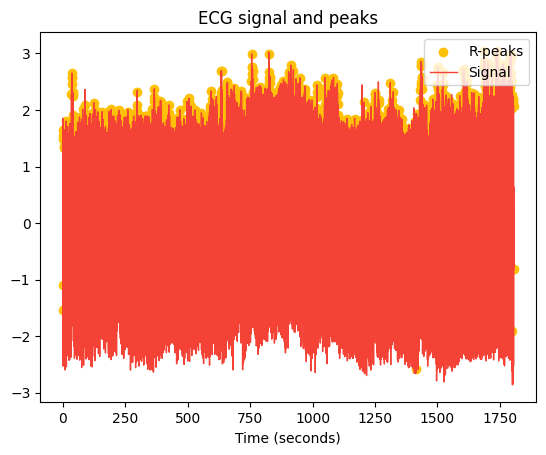

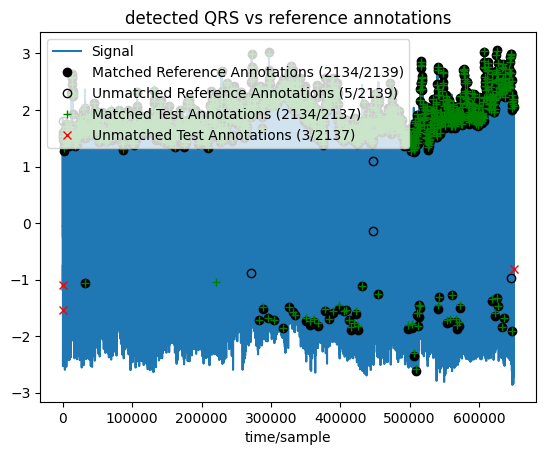

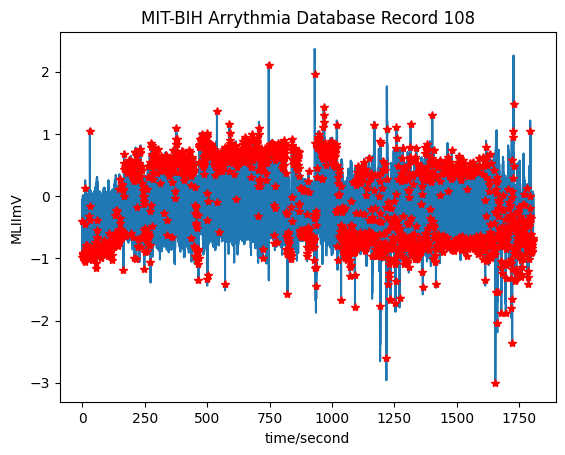

1823 reference annotations, 1871 test annotations

True Positives (matched samples): 1731
False Positives (unmatched test samples): 140
False Negatives (unmatched reference samples): 92

Sensitivity: 0.9495 (1731/1823)
Positive Predictivity: 0.9252 (1731/1871)


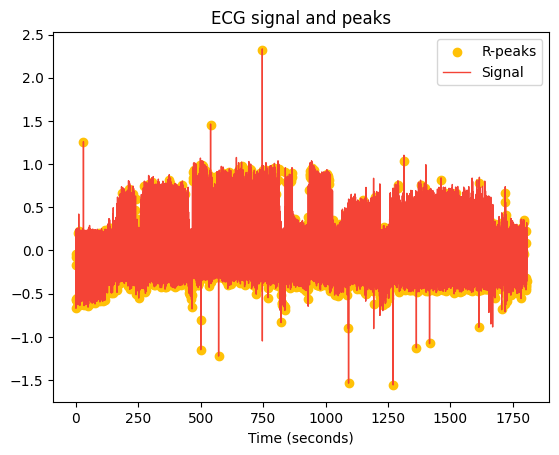

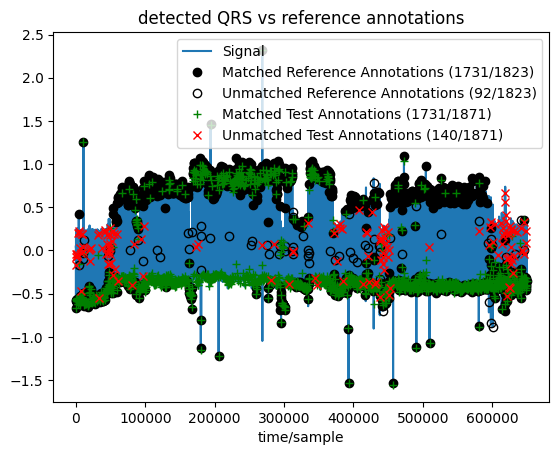

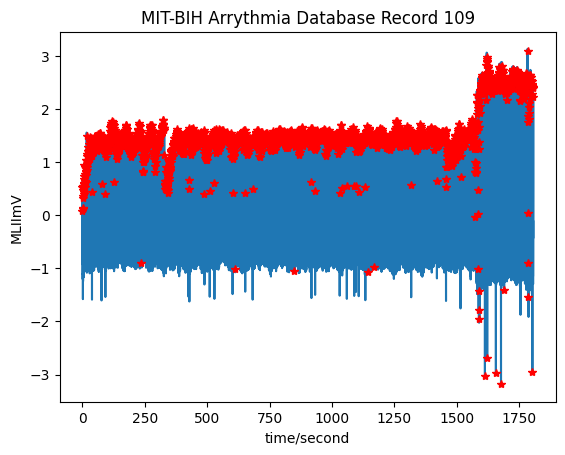

2534 reference annotations, 2529 test annotations

True Positives (matched samples): 2527
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 7

Sensitivity: 0.9972 (2527/2534)
Positive Predictivity: 0.9992 (2527/2529)


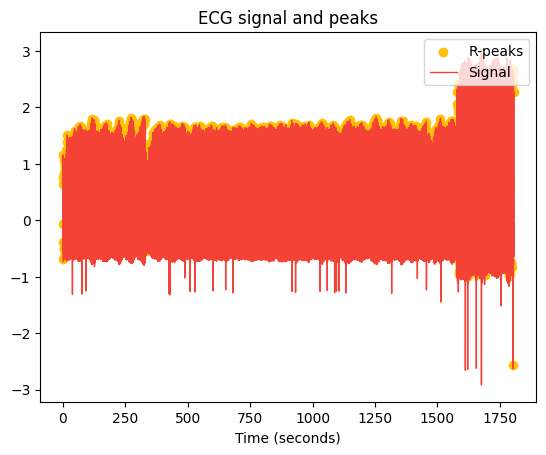

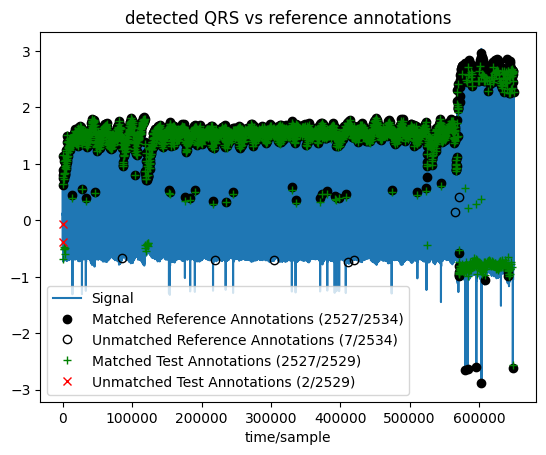

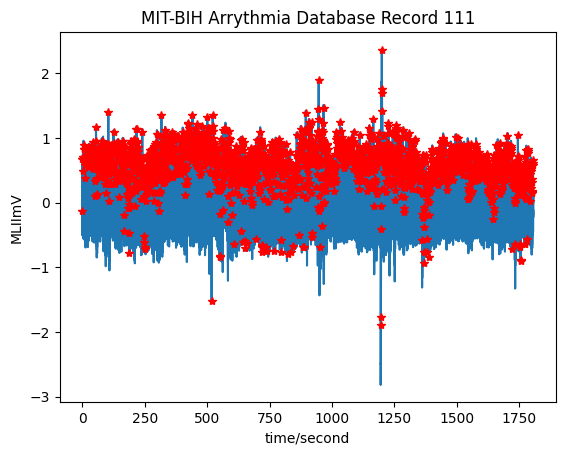

2132 reference annotations, 2126 test annotations

True Positives (matched samples): 2123
False Positives (unmatched test samples): 3
False Negatives (unmatched reference samples): 9

Sensitivity: 0.9958 (2123/2132)
Positive Predictivity: 0.9986 (2123/2126)


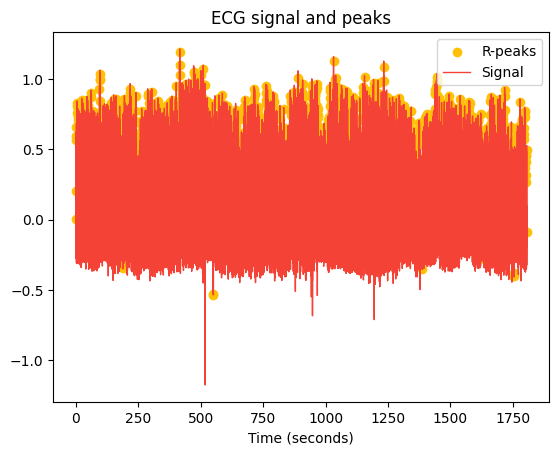

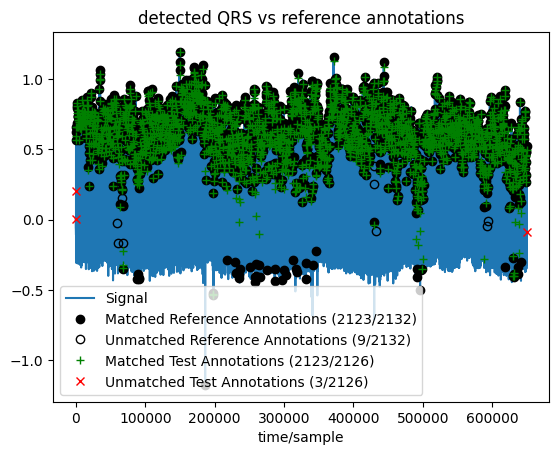

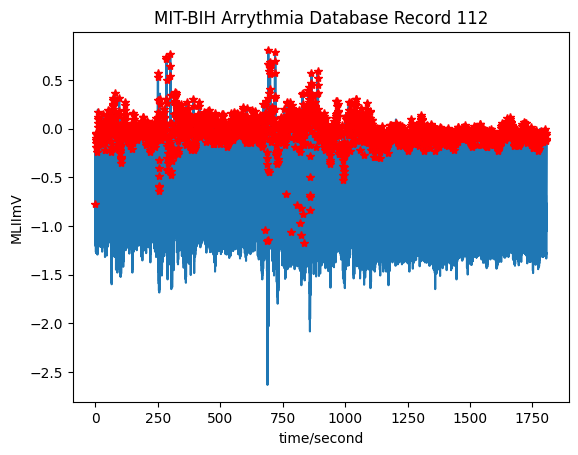

2549 reference annotations, 2540 test annotations

True Positives (matched samples): 2539
False Positives (unmatched test samples): 1
False Negatives (unmatched reference samples): 10

Sensitivity: 0.9961 (2539/2549)
Positive Predictivity: 0.9996 (2539/2540)


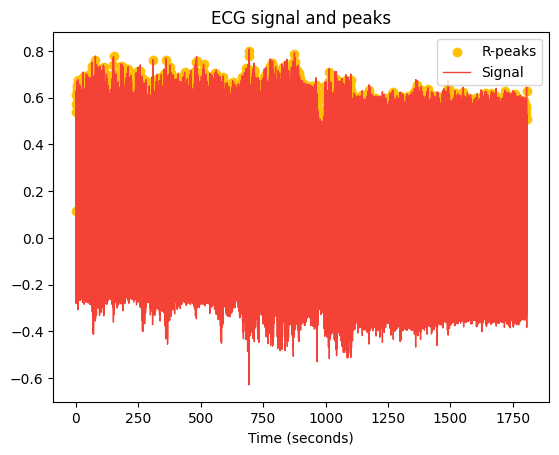

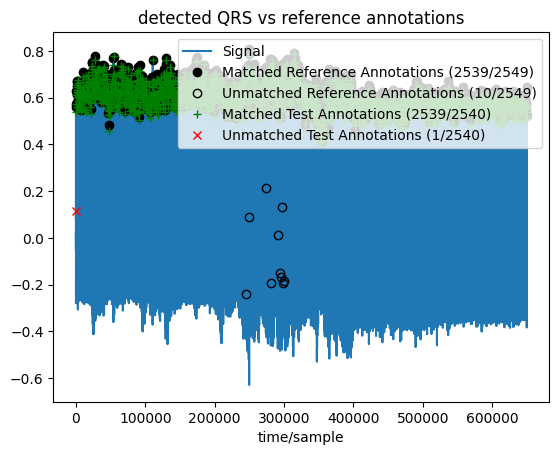

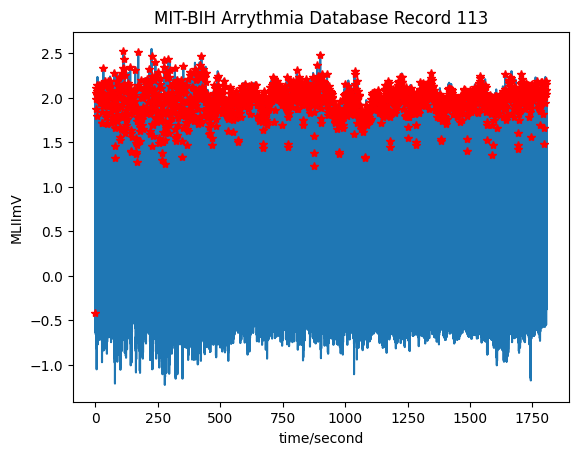

1795 reference annotations, 1796 test annotations

True Positives (matched samples): 1795
False Positives (unmatched test samples): 1
False Negatives (unmatched reference samples): 0

Sensitivity: 1.0000 (1795/1795)
Positive Predictivity: 0.9994 (1795/1796)


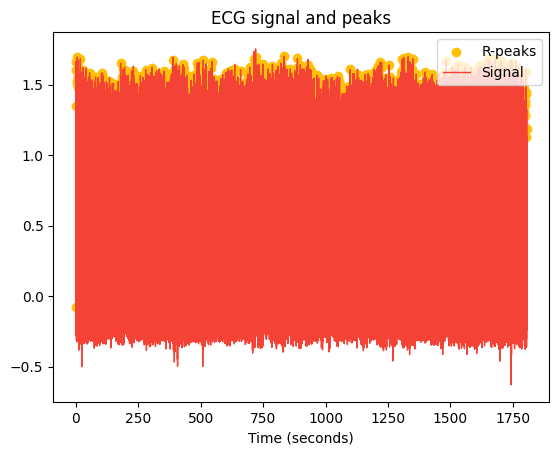

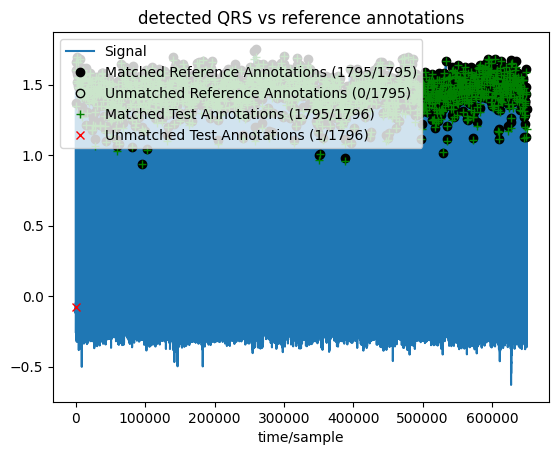

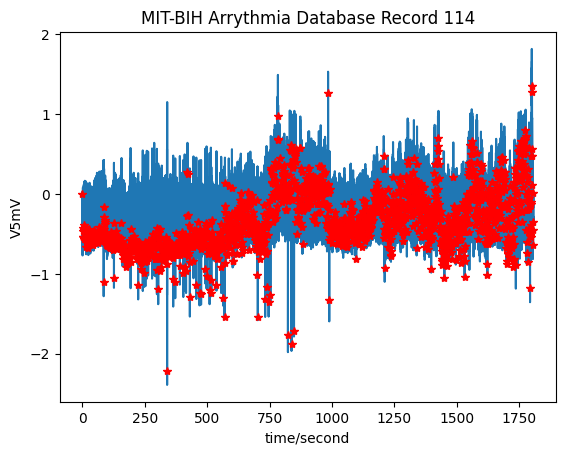

1889 reference annotations, 1890 test annotations

True Positives (matched samples): 1878
False Positives (unmatched test samples): 12
False Negatives (unmatched reference samples): 11

Sensitivity: 0.9942 (1878/1889)
Positive Predictivity: 0.9937 (1878/1890)


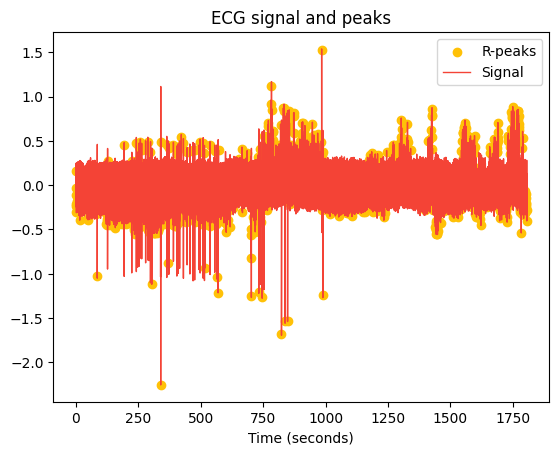

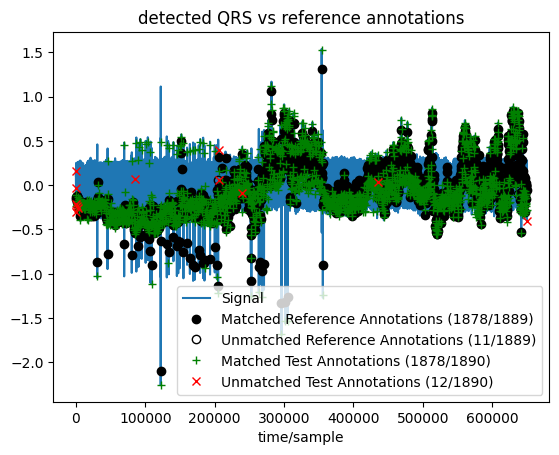

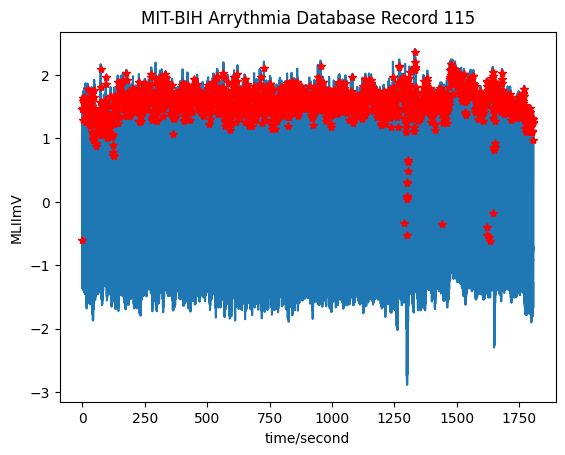

1961 reference annotations, 1954 test annotations

True Positives (matched samples): 1953
False Positives (unmatched test samples): 1
False Negatives (unmatched reference samples): 8

Sensitivity: 0.9959 (1953/1961)
Positive Predictivity: 0.9995 (1953/1954)


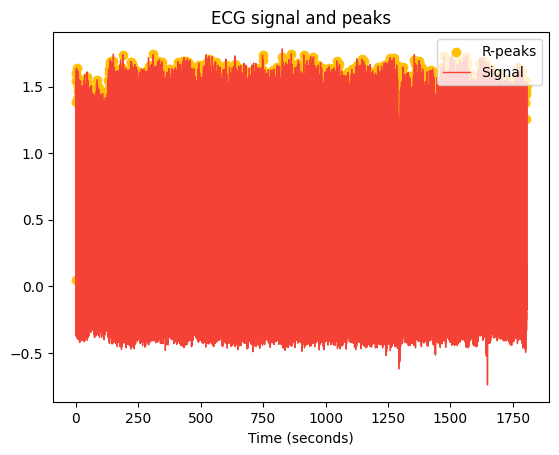

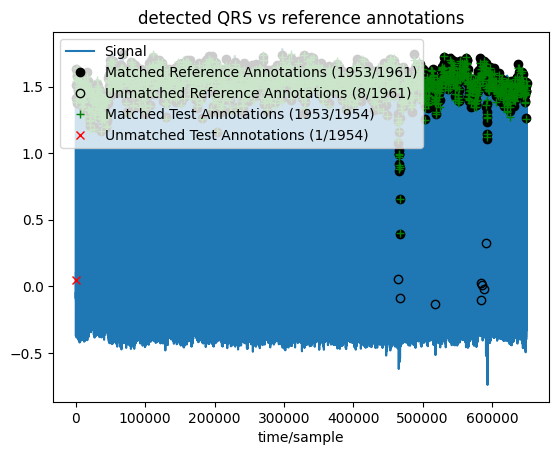

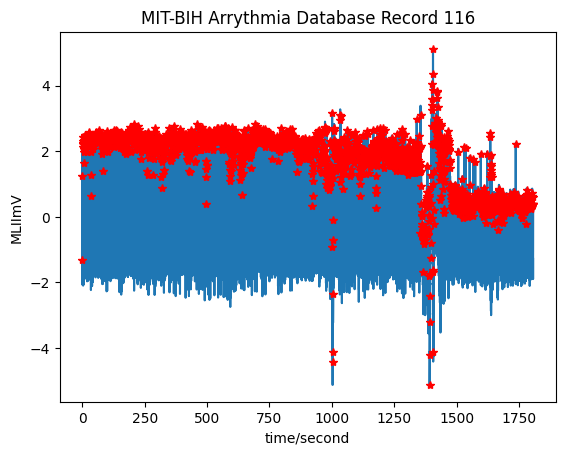

2420 reference annotations, 2399 test annotations

True Positives (matched samples): 2396
False Positives (unmatched test samples): 3
False Negatives (unmatched reference samples): 24

Sensitivity: 0.9901 (2396/2420)
Positive Predictivity: 0.9987 (2396/2399)


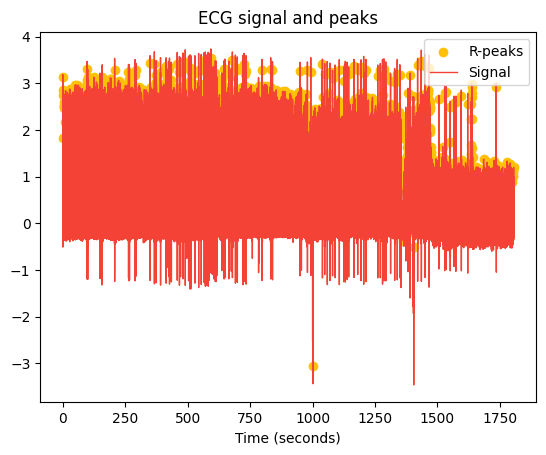

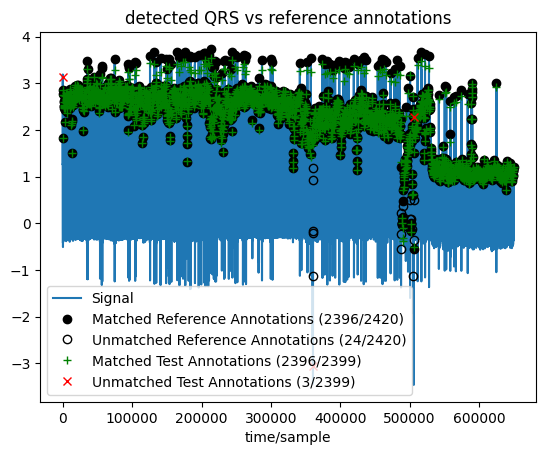

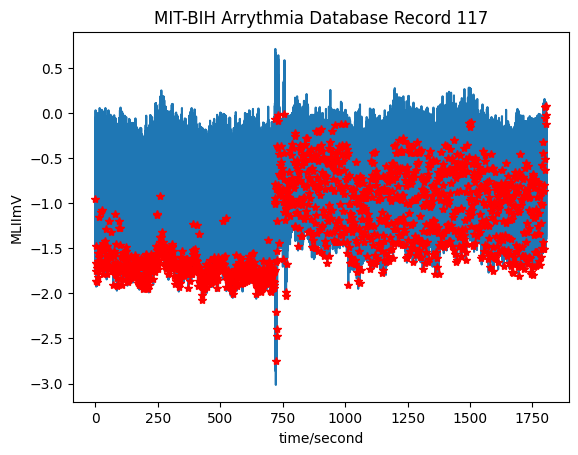

1538 reference annotations, 1537 test annotations

True Positives (matched samples): 1535
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 3

Sensitivity: 0.9980 (1535/1538)
Positive Predictivity: 0.9987 (1535/1537)


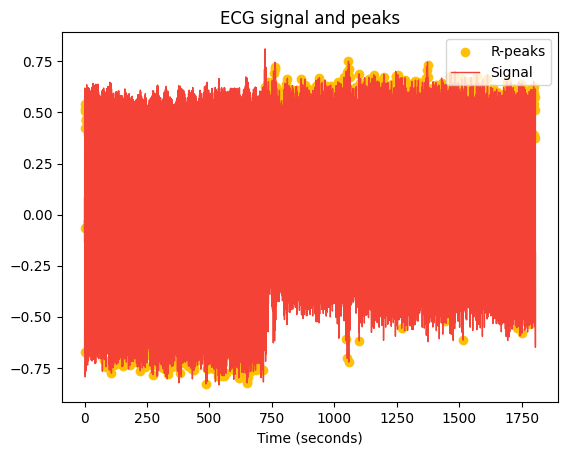

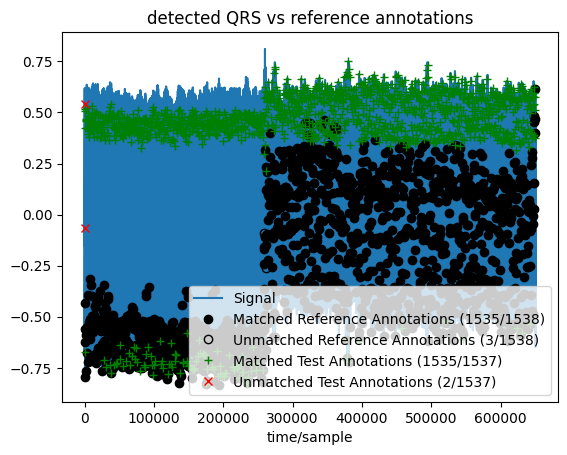

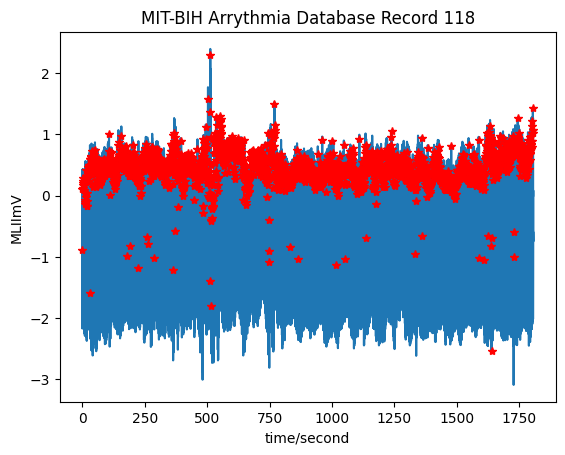

2300 reference annotations, 2279 test annotations

True Positives (matched samples): 2278
False Positives (unmatched test samples): 1
False Negatives (unmatched reference samples): 22

Sensitivity: 0.9904 (2278/2300)
Positive Predictivity: 0.9996 (2278/2279)


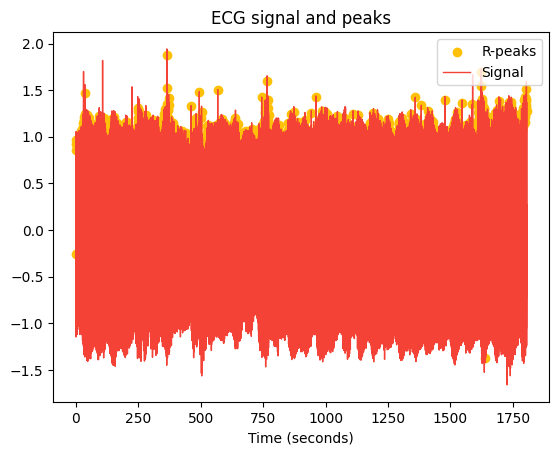

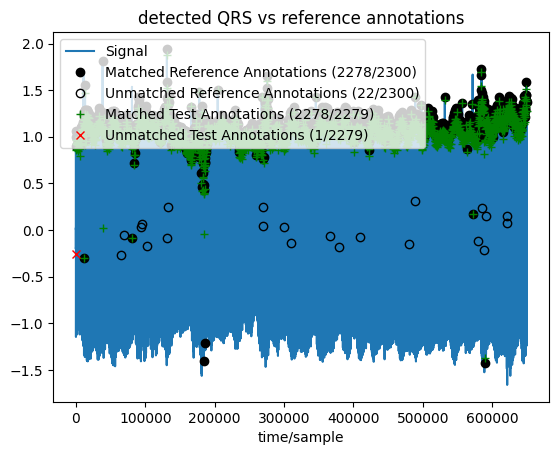

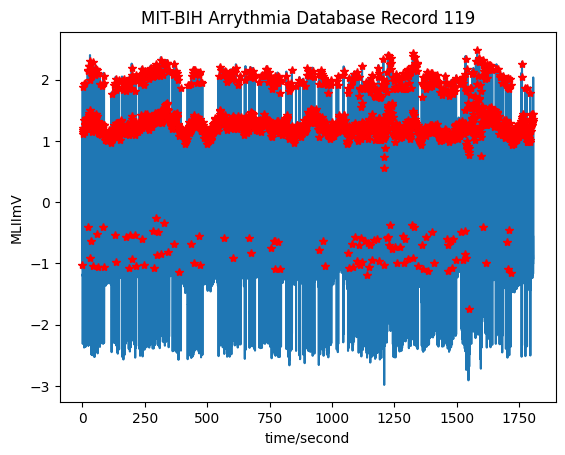

2093 reference annotations, 1989 test annotations

True Positives (matched samples): 1987
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 106

Sensitivity: 0.9494 (1987/2093)
Positive Predictivity: 0.9990 (1987/1989)


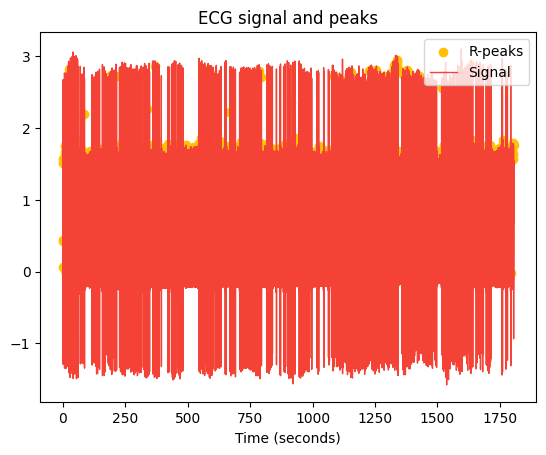

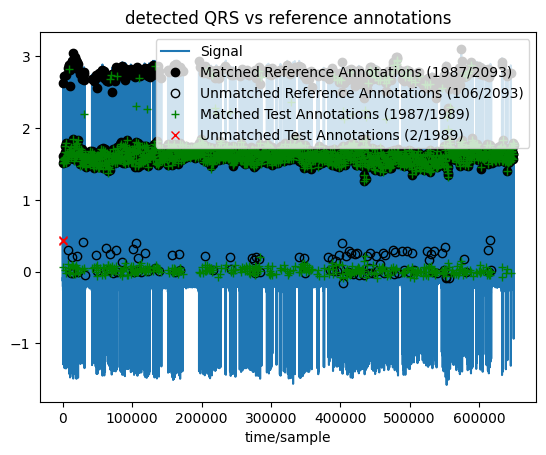

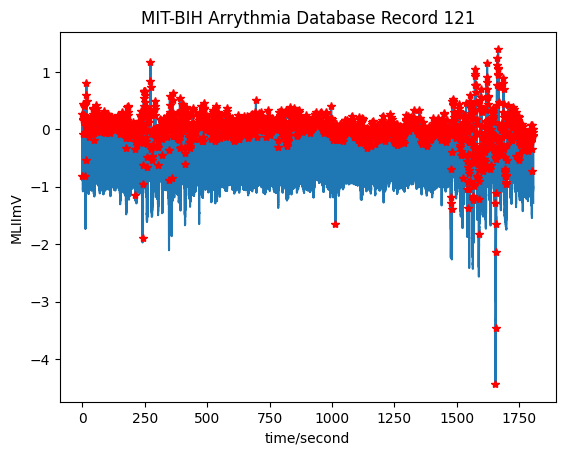

1875 reference annotations, 1865 test annotations

True Positives (matched samples): 1863
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 12

Sensitivity: 0.9936 (1863/1875)
Positive Predictivity: 0.9989 (1863/1865)


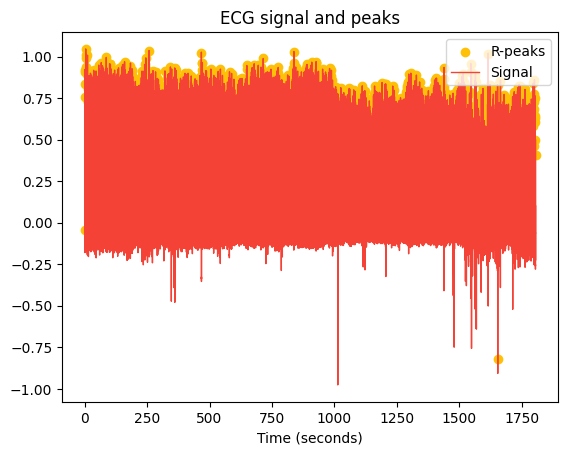

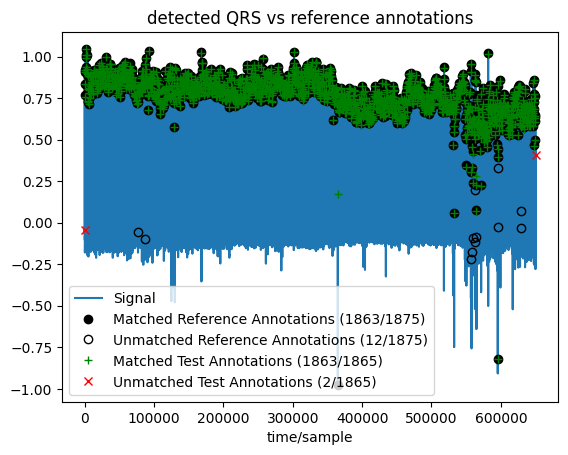

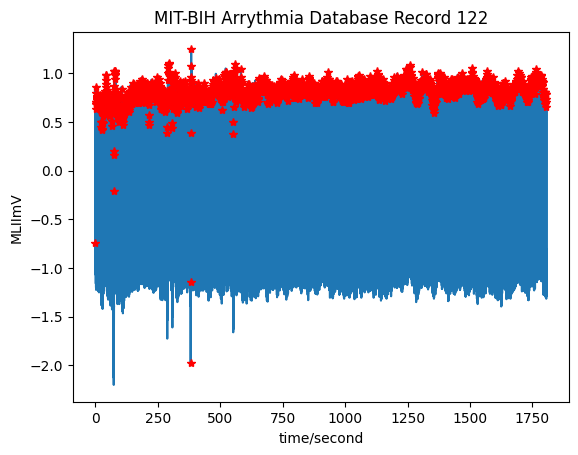

2478 reference annotations, 2477 test annotations

True Positives (matched samples): 2476
False Positives (unmatched test samples): 1
False Negatives (unmatched reference samples): 2

Sensitivity: 0.9992 (2476/2478)
Positive Predictivity: 0.9996 (2476/2477)


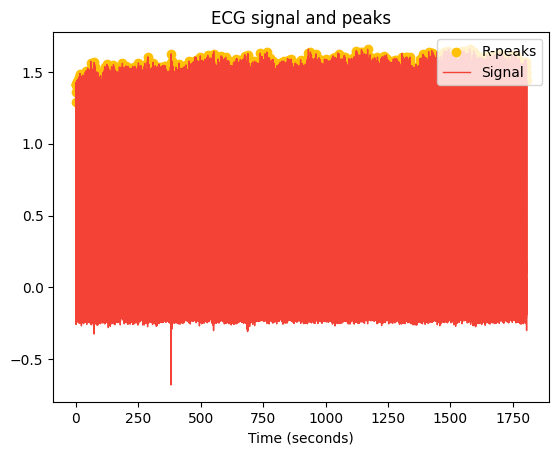

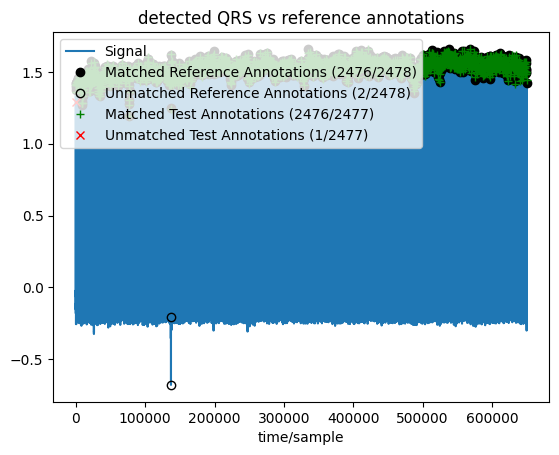

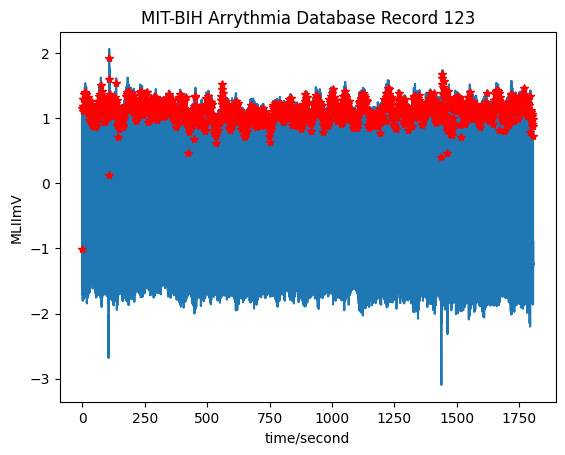

1518 reference annotations, 1516 test annotations

True Positives (matched samples): 1515
False Positives (unmatched test samples): 1
False Negatives (unmatched reference samples): 3

Sensitivity: 0.9980 (1515/1518)
Positive Predictivity: 0.9993 (1515/1516)


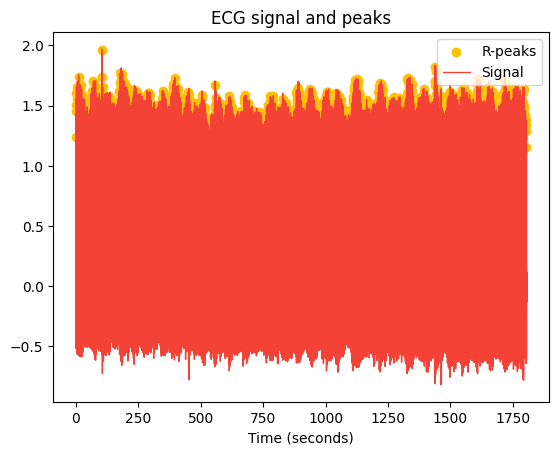

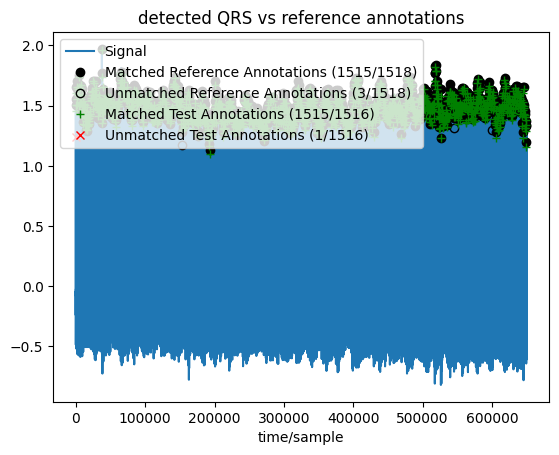

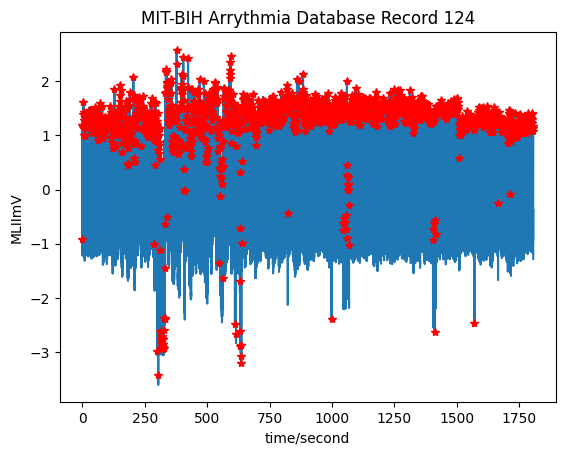

1633 reference annotations, 1619 test annotations

True Positives (matched samples): 1617
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 16

Sensitivity: 0.9902 (1617/1633)
Positive Predictivity: 0.9988 (1617/1619)


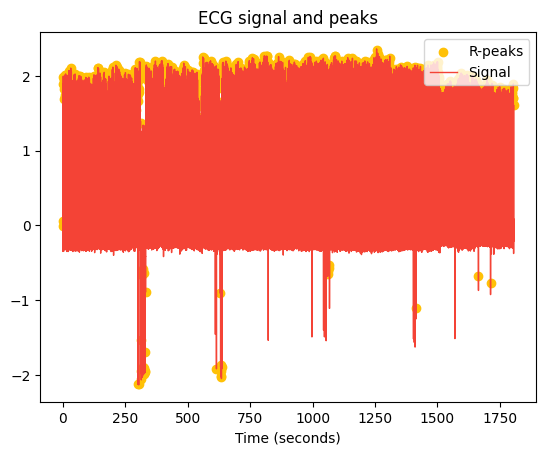

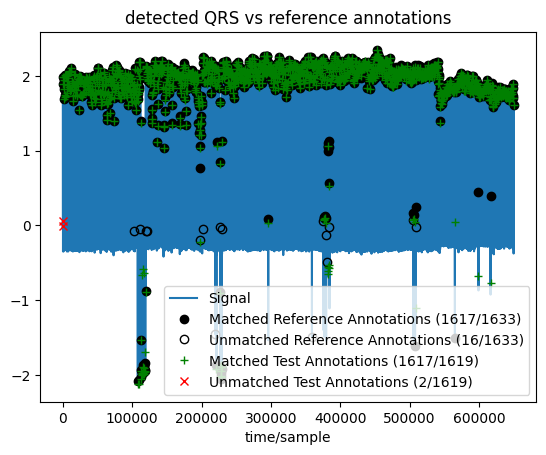

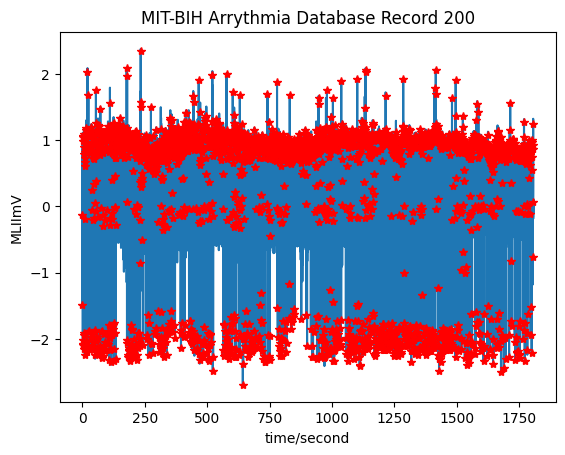

2791 reference annotations, 2600 test annotations

True Positives (matched samples): 2598
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 193

Sensitivity: 0.9308 (2598/2791)
Positive Predictivity: 0.9992 (2598/2600)


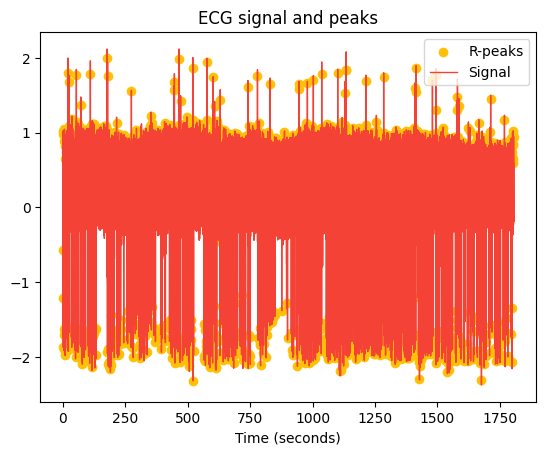

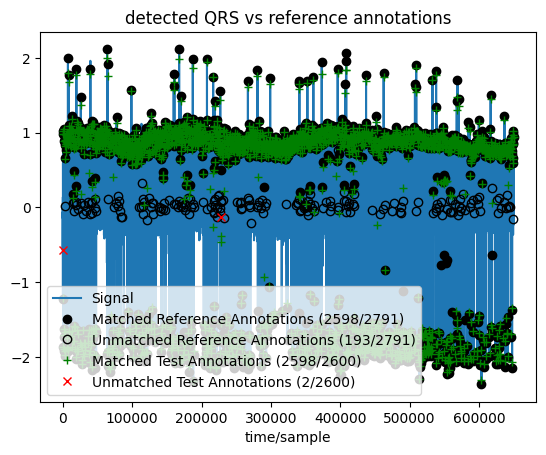

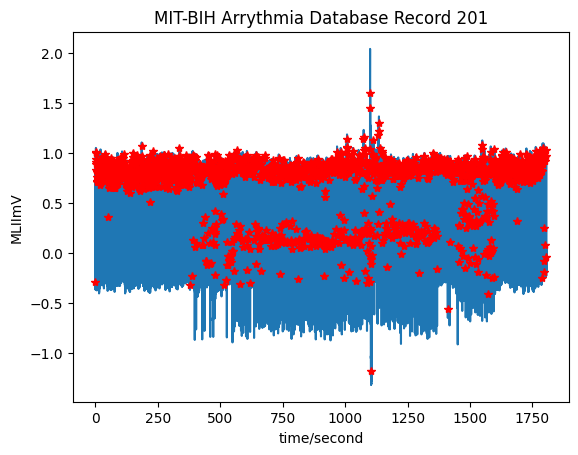

2038 reference annotations, 1909 test annotations

True Positives (matched samples): 1903
False Positives (unmatched test samples): 6
False Negatives (unmatched reference samples): 135

Sensitivity: 0.9338 (1903/2038)
Positive Predictivity: 0.9969 (1903/1909)


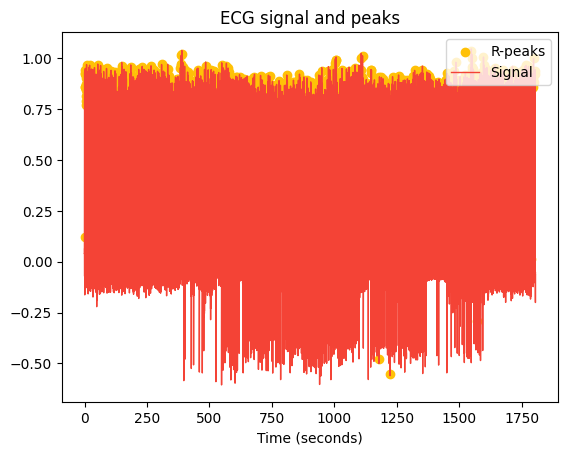

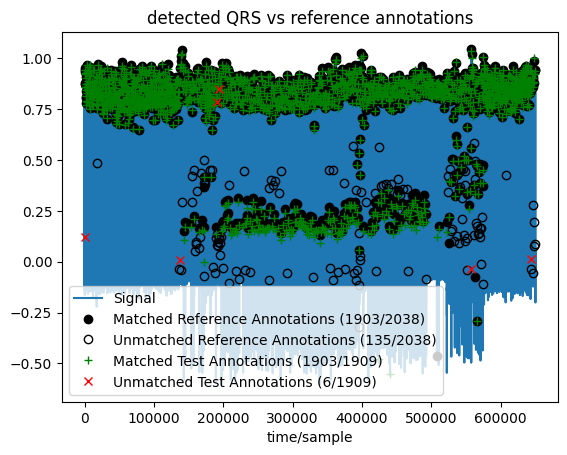

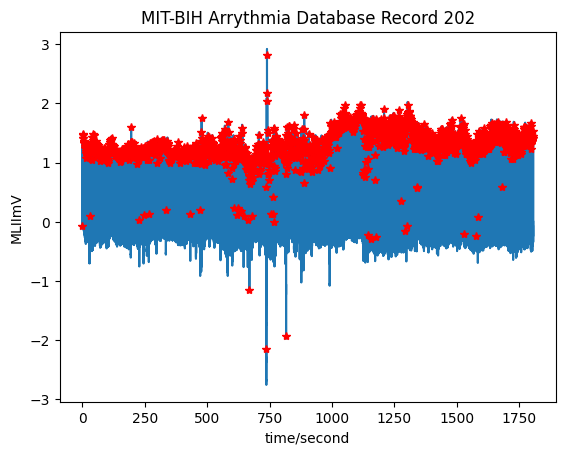

2145 reference annotations, 2127 test annotations

True Positives (matched samples): 2125
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 20

Sensitivity: 0.9907 (2125/2145)
Positive Predictivity: 0.9991 (2125/2127)


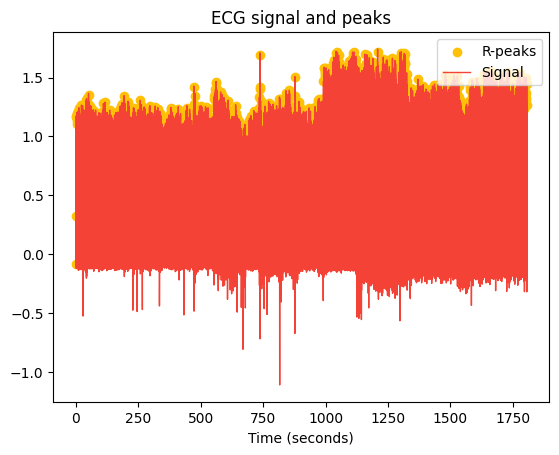

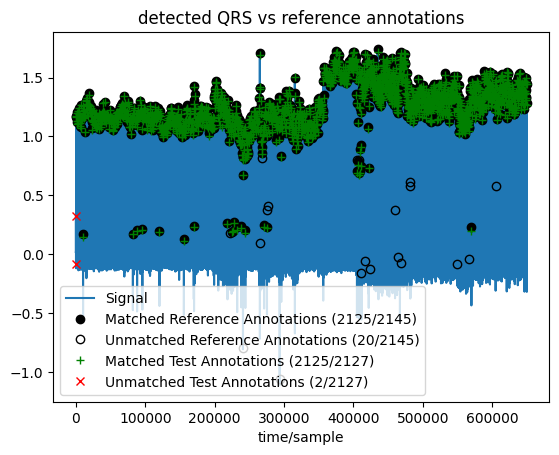

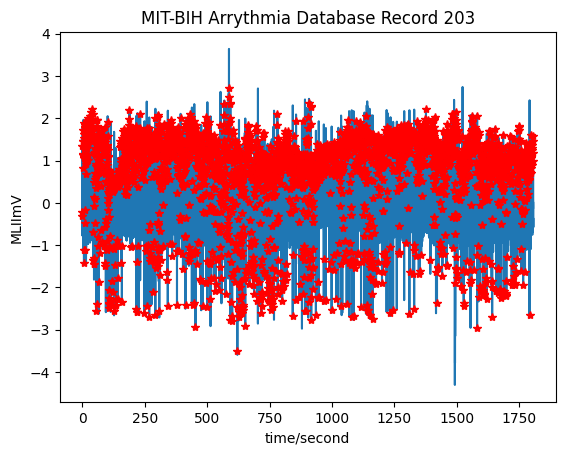

3107 reference annotations, 2852 test annotations

True Positives (matched samples): 2839
False Positives (unmatched test samples): 13
False Negatives (unmatched reference samples): 268

Sensitivity: 0.9137 (2839/3107)
Positive Predictivity: 0.9954 (2839/2852)


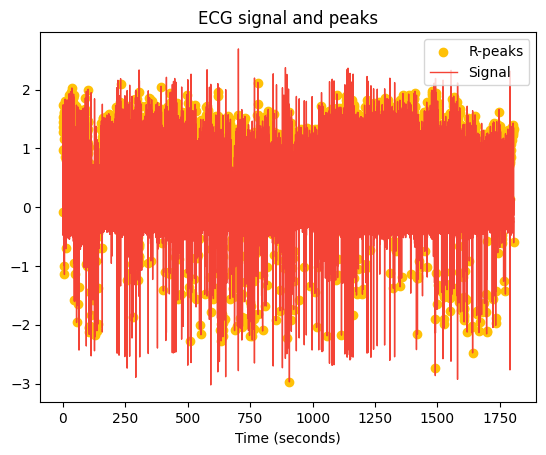

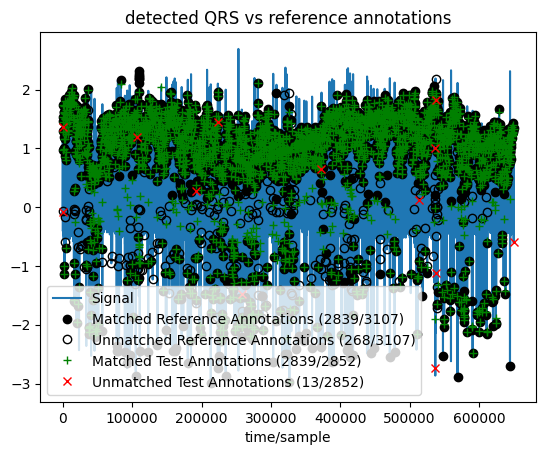

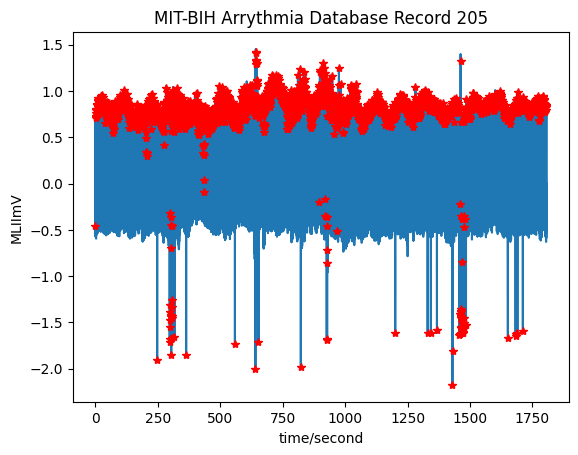

2671 reference annotations, 2631 test annotations

True Positives (matched samples): 2629
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 42

Sensitivity: 0.9843 (2629/2671)
Positive Predictivity: 0.9992 (2629/2631)


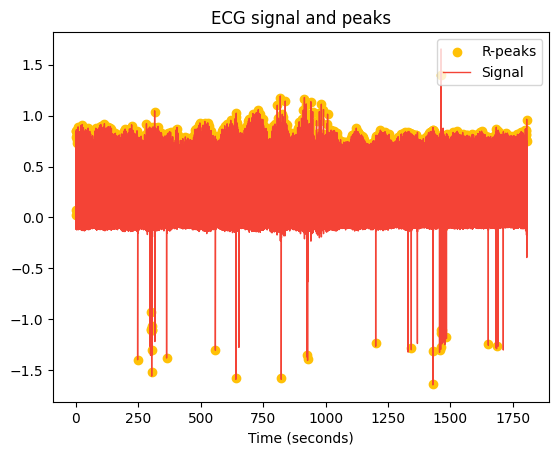

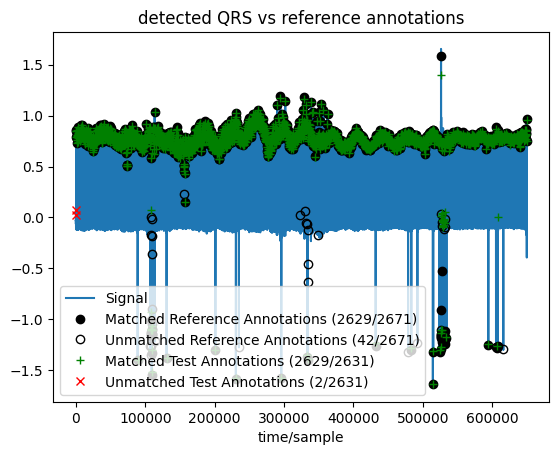

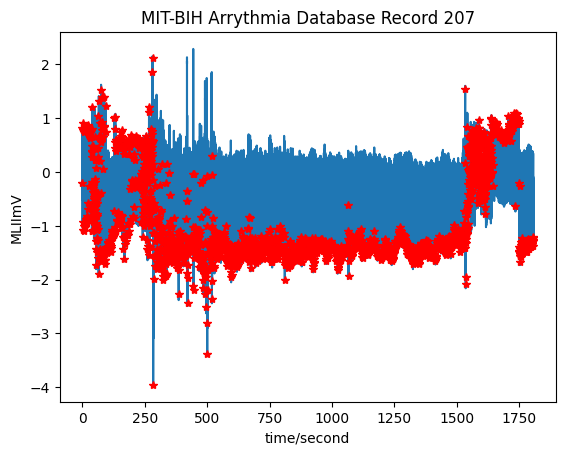

2384 reference annotations, 2113 test annotations

True Positives (matched samples): 2057
False Positives (unmatched test samples): 56
False Negatives (unmatched reference samples): 327

Sensitivity: 0.8628 (2057/2384)
Positive Predictivity: 0.9735 (2057/2113)


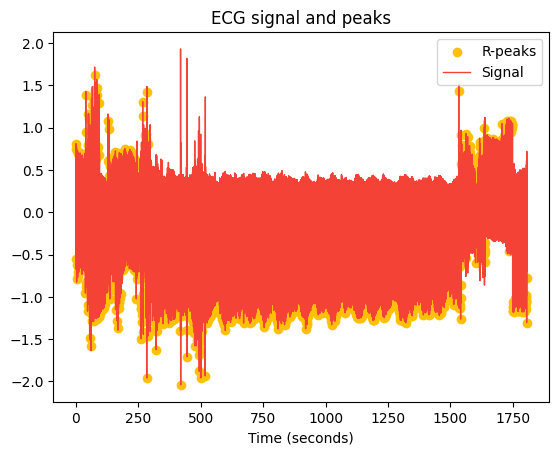

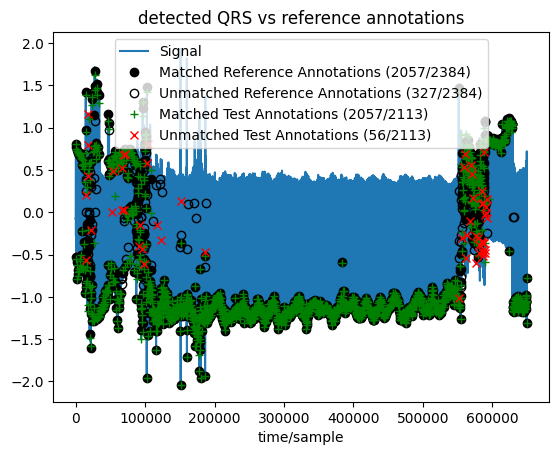

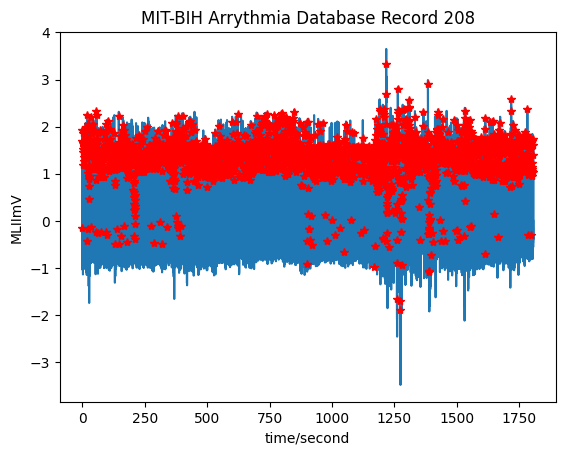

3039 reference annotations, 2359 test annotations

True Positives (matched samples): 2354
False Positives (unmatched test samples): 5
False Negatives (unmatched reference samples): 685

Sensitivity: 0.7746 (2354/3039)
Positive Predictivity: 0.9979 (2354/2359)


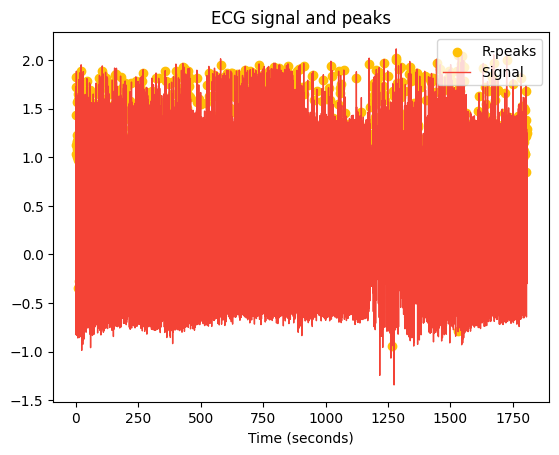

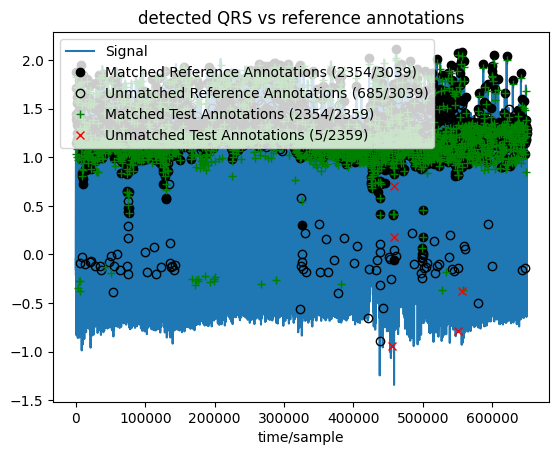

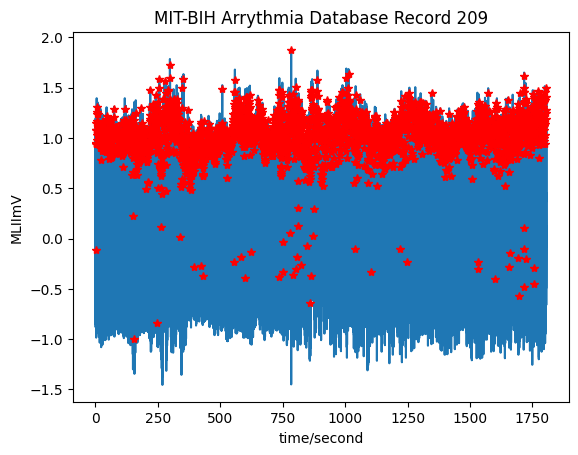

3051 reference annotations, 3004 test annotations

True Positives (matched samples): 3002
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 49

Sensitivity: 0.9839 (3002/3051)
Positive Predictivity: 0.9993 (3002/3004)


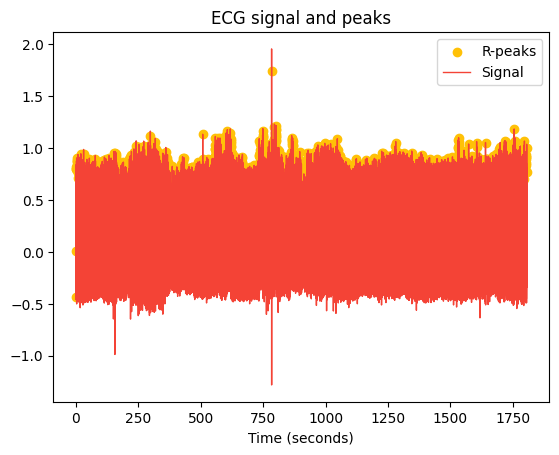

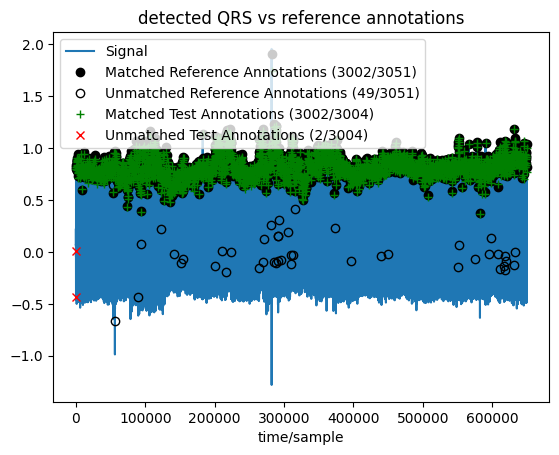

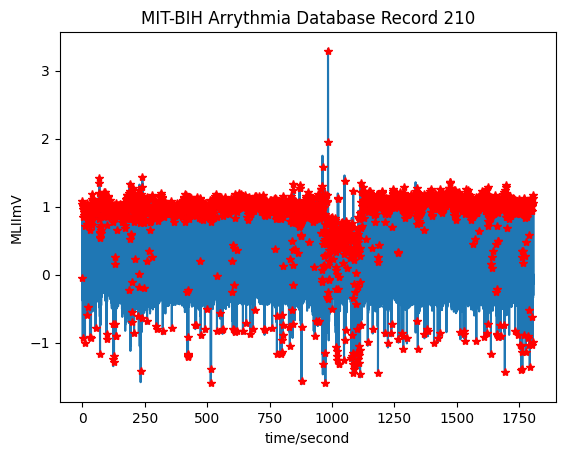

2684 reference annotations, 2532 test annotations

True Positives (matched samples): 2530
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 154

Sensitivity: 0.9426 (2530/2684)
Positive Predictivity: 0.9992 (2530/2532)


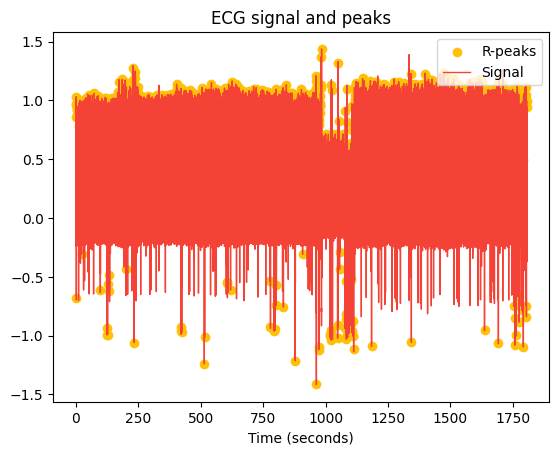

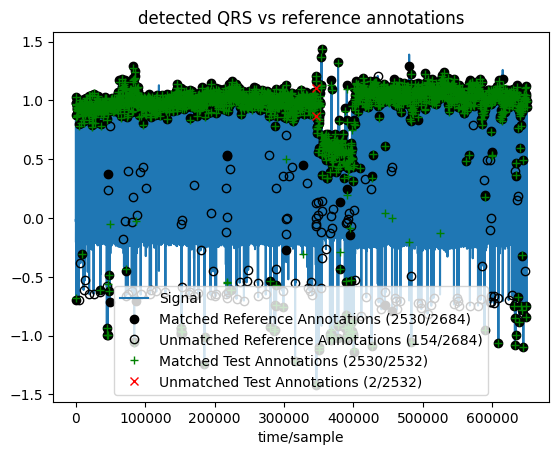

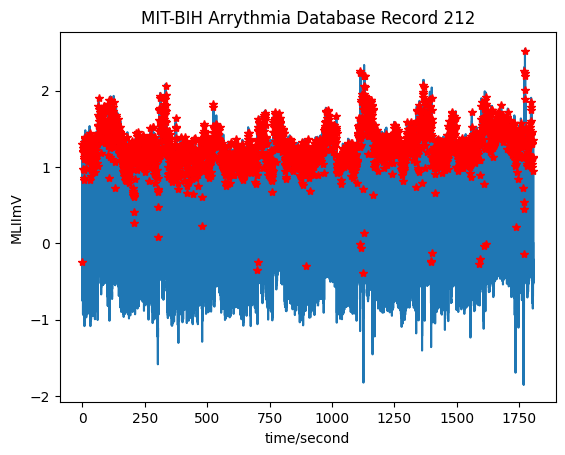

2762 reference annotations, 2750 test annotations

True Positives (matched samples): 2748
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 14

Sensitivity: 0.9949 (2748/2762)
Positive Predictivity: 0.9993 (2748/2750)


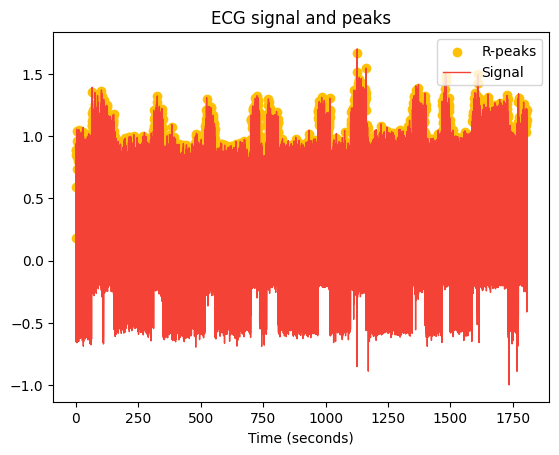

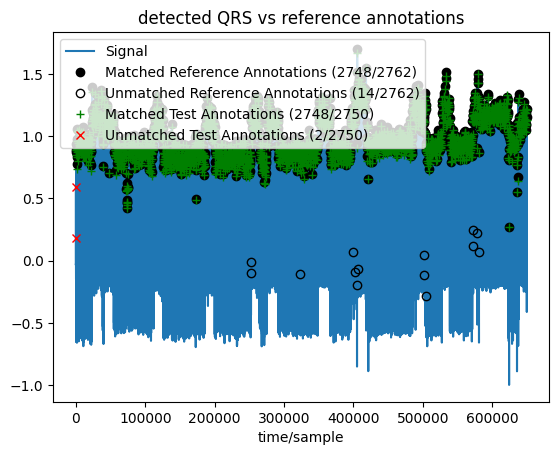

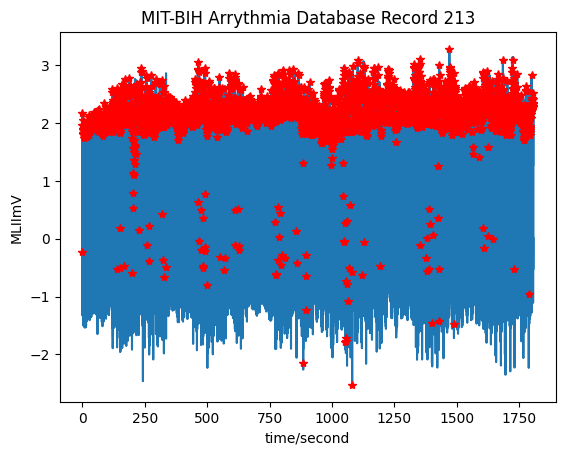

3293 reference annotations, 3146 test annotations

True Positives (matched samples): 3140
False Positives (unmatched test samples): 6
False Negatives (unmatched reference samples): 153

Sensitivity: 0.9535 (3140/3293)
Positive Predictivity: 0.9981 (3140/3146)


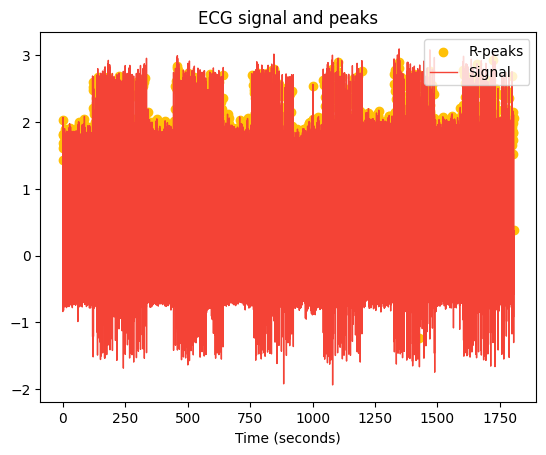

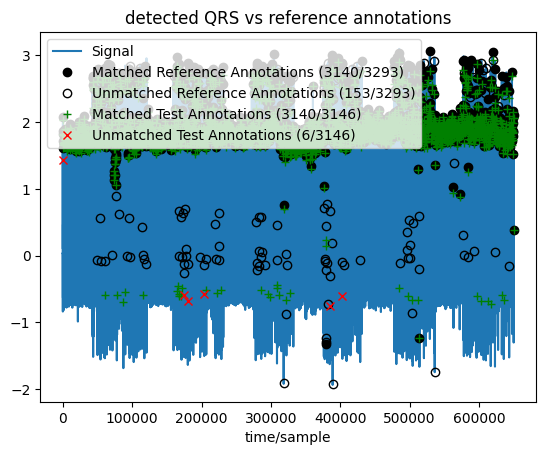

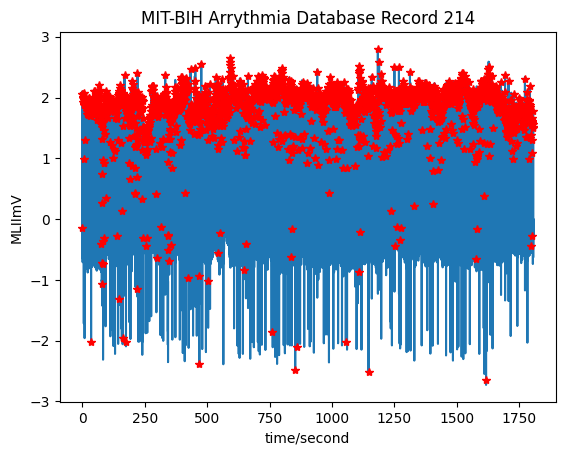

2296 reference annotations, 2255 test annotations

True Positives (matched samples): 2253
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 43

Sensitivity: 0.9813 (2253/2296)
Positive Predictivity: 0.9991 (2253/2255)


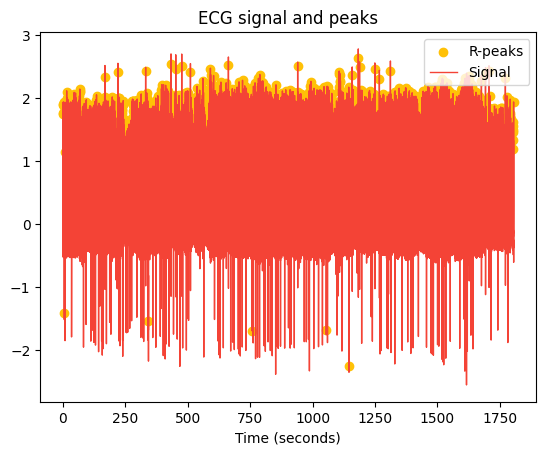

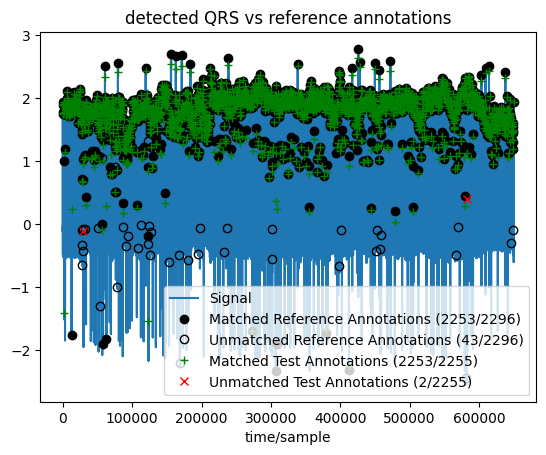

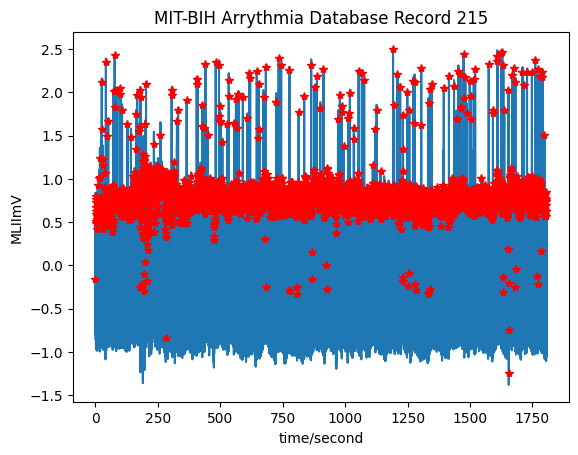

3399 reference annotations, 3355 test annotations

True Positives (matched samples): 3354
False Positives (unmatched test samples): 1
False Negatives (unmatched reference samples): 45

Sensitivity: 0.9868 (3354/3399)
Positive Predictivity: 0.9997 (3354/3355)


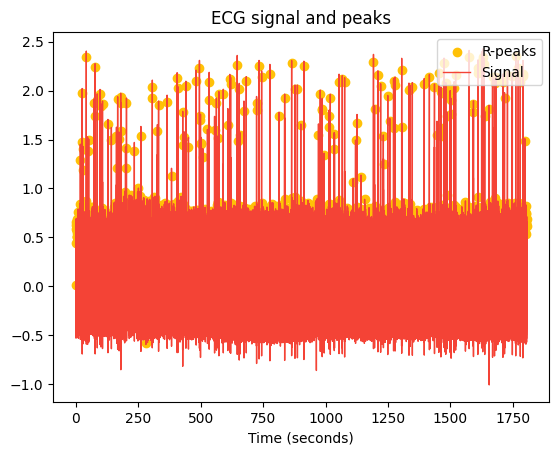

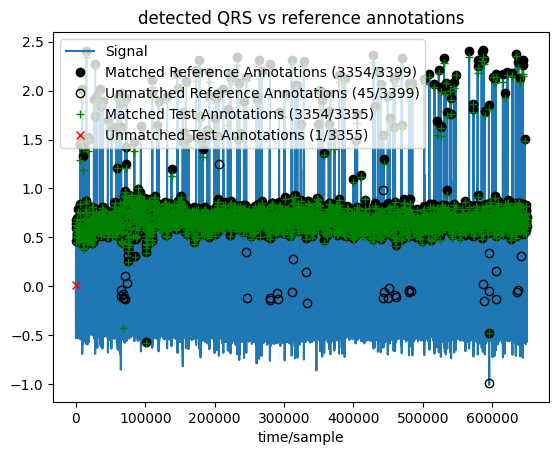

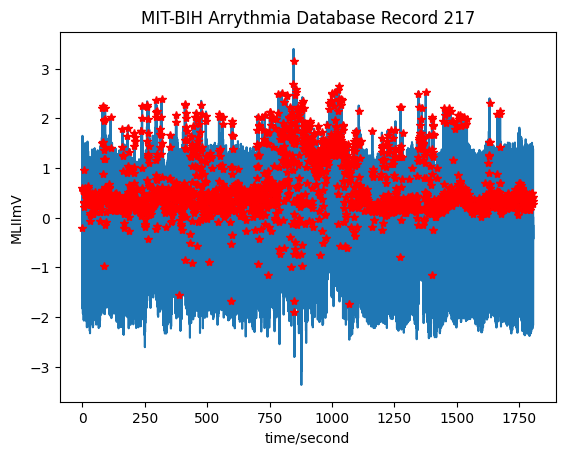

2279 reference annotations, 2206 test annotations

True Positives (matched samples): 2203
False Positives (unmatched test samples): 3
False Negatives (unmatched reference samples): 76

Sensitivity: 0.9667 (2203/2279)
Positive Predictivity: 0.9986 (2203/2206)


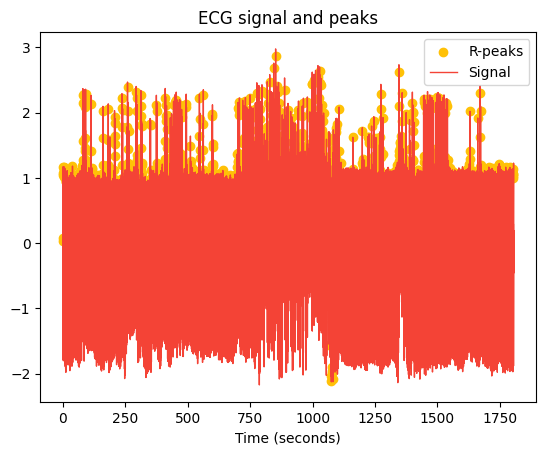

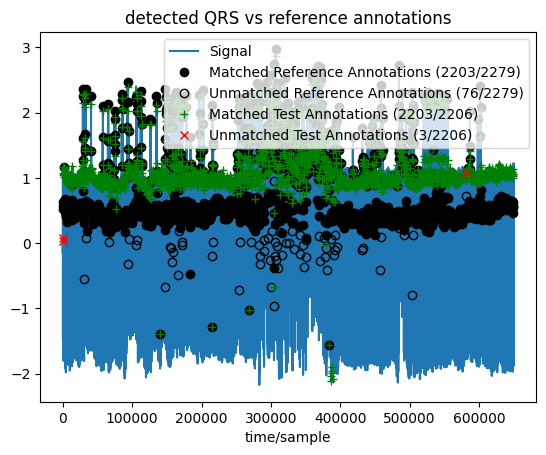

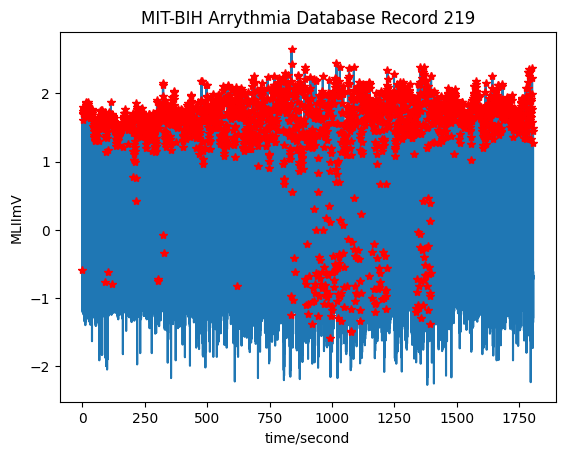

2311 reference annotations, 2157 test annotations

True Positives (matched samples): 2152
False Positives (unmatched test samples): 5
False Negatives (unmatched reference samples): 159

Sensitivity: 0.9312 (2152/2311)
Positive Predictivity: 0.9977 (2152/2157)


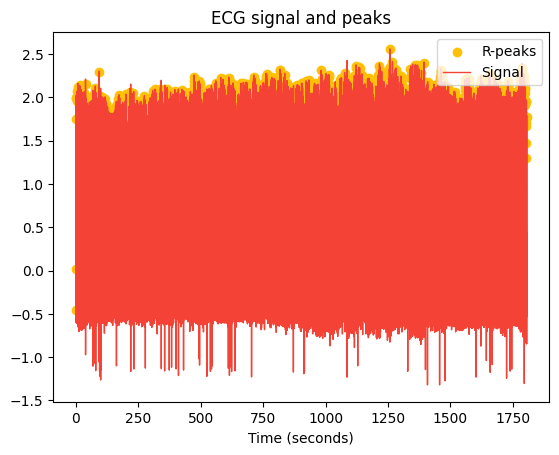

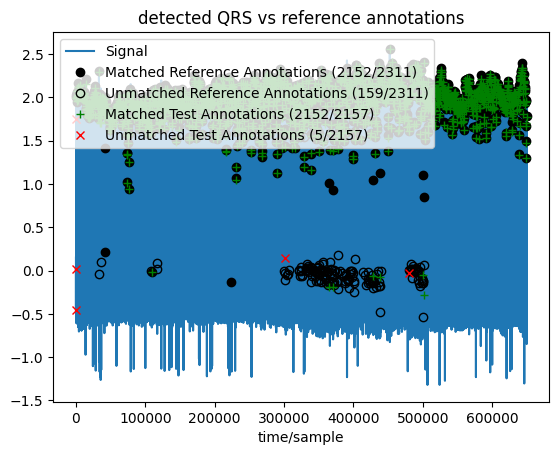

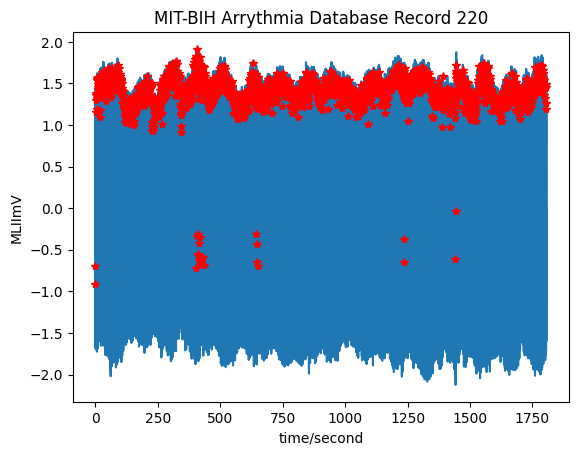

2068 reference annotations, 2048 test annotations

True Positives (matched samples): 2048
False Positives (unmatched test samples): 0
False Negatives (unmatched reference samples): 20

Sensitivity: 0.9903 (2048/2068)
Positive Predictivity: 1.0000 (2048/2048)


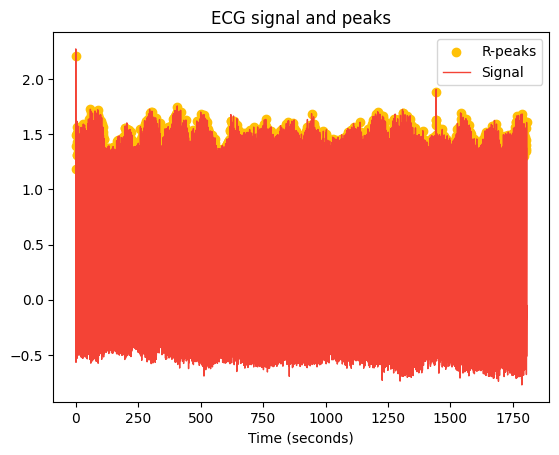

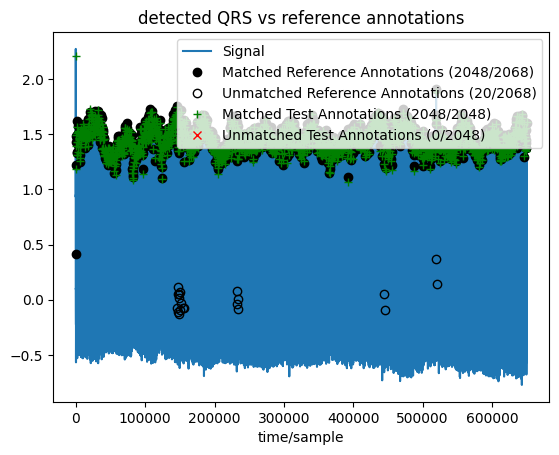

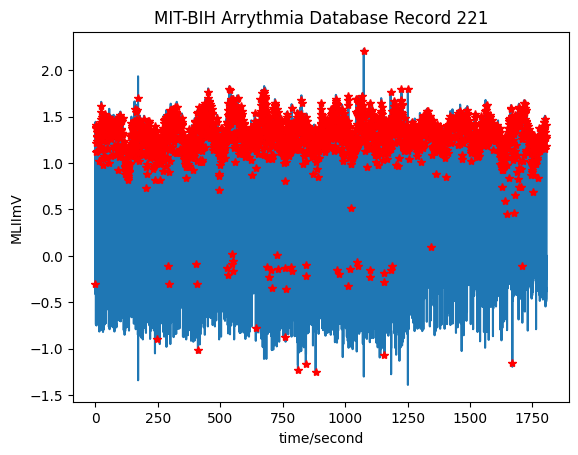

2461 reference annotations, 2041 test annotations

True Positives (matched samples): 2039
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 422

Sensitivity: 0.8285 (2039/2461)
Positive Predictivity: 0.9990 (2039/2041)


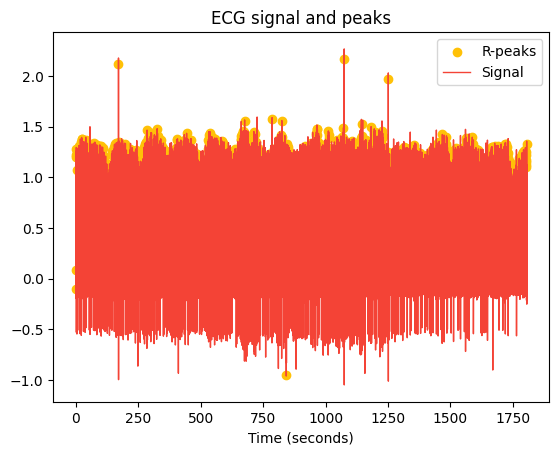

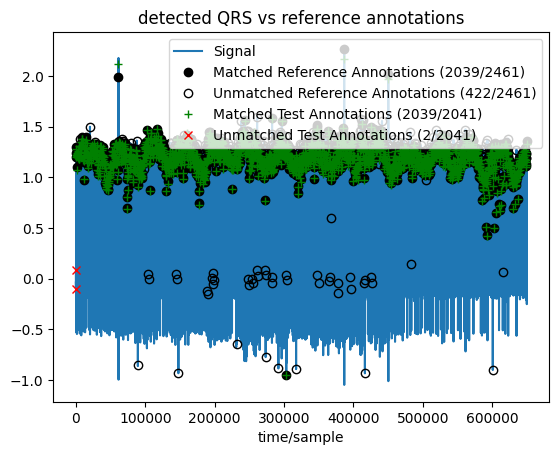

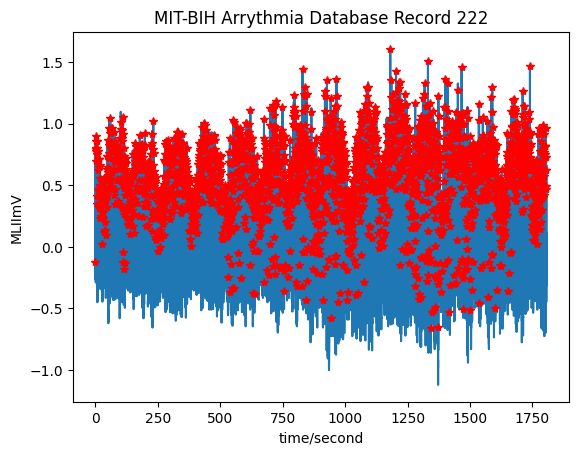

2633 reference annotations, 2458 test annotations

True Positives (matched samples): 2458
False Positives (unmatched test samples): 0
False Negatives (unmatched reference samples): 175

Sensitivity: 0.9335 (2458/2633)
Positive Predictivity: 1.0000 (2458/2458)


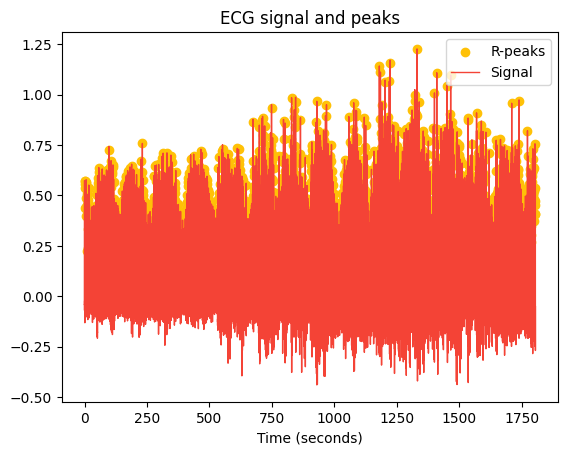

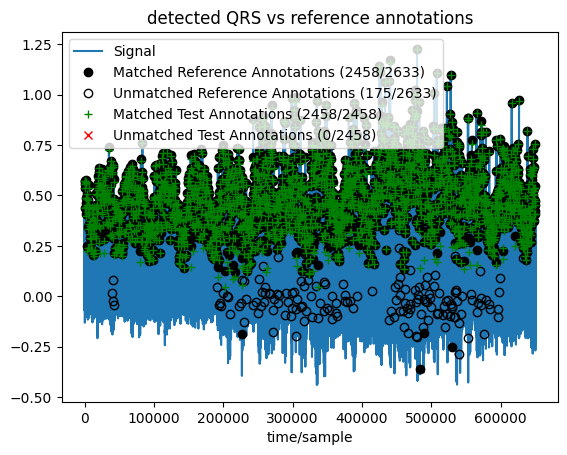

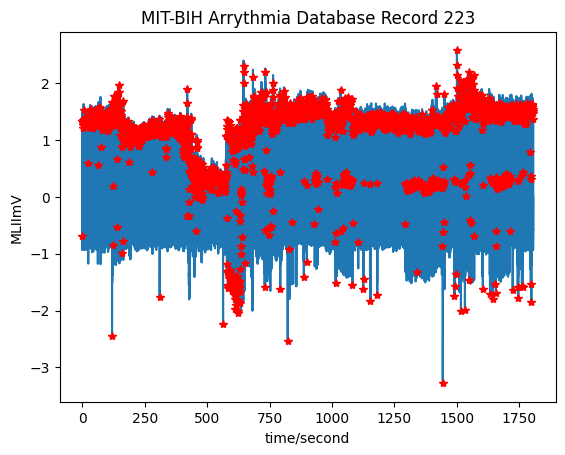

2642 reference annotations, 2532 test annotations

True Positives (matched samples): 2530
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 112

Sensitivity: 0.9576 (2530/2642)
Positive Predictivity: 0.9992 (2530/2532)


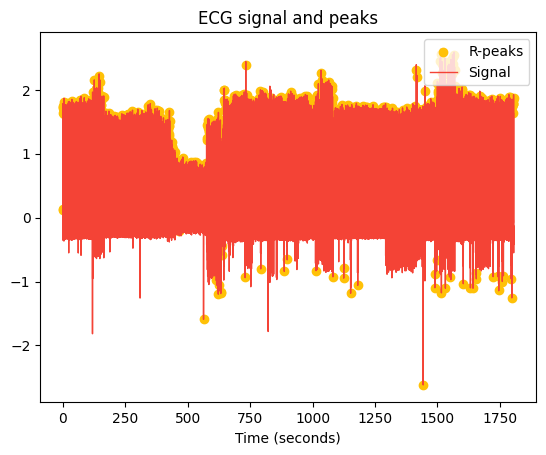

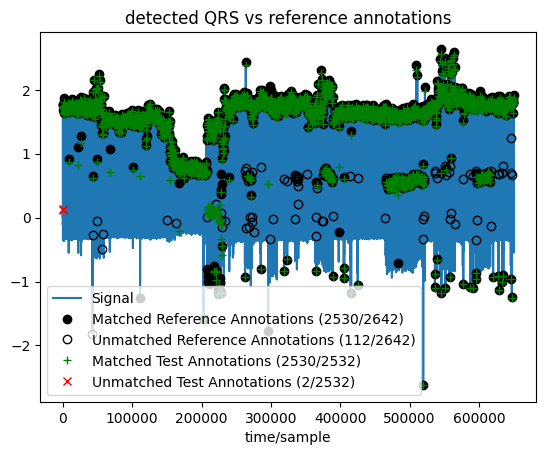

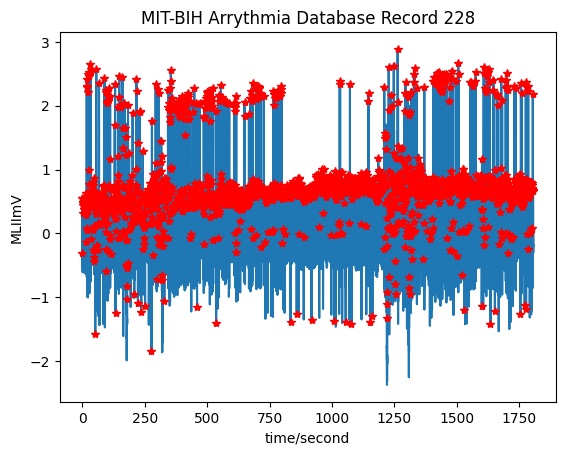

2140 reference annotations, 2086 test annotations

True Positives (matched samples): 2051
False Positives (unmatched test samples): 35
False Negatives (unmatched reference samples): 89

Sensitivity: 0.9584 (2051/2140)
Positive Predictivity: 0.9832 (2051/2086)


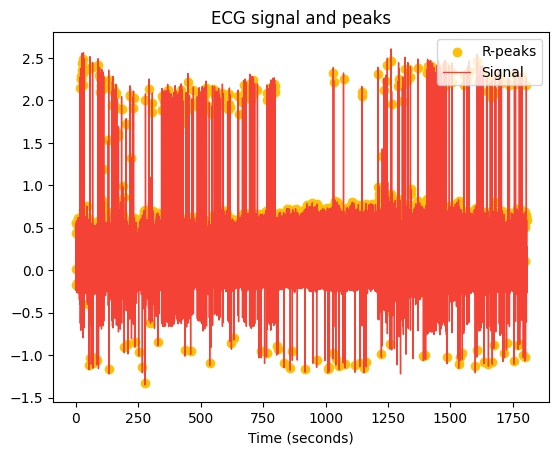

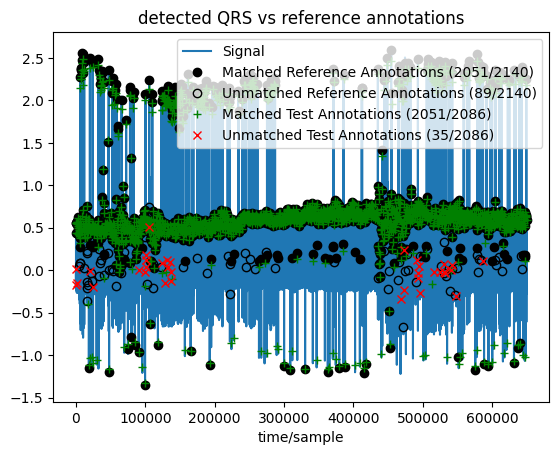

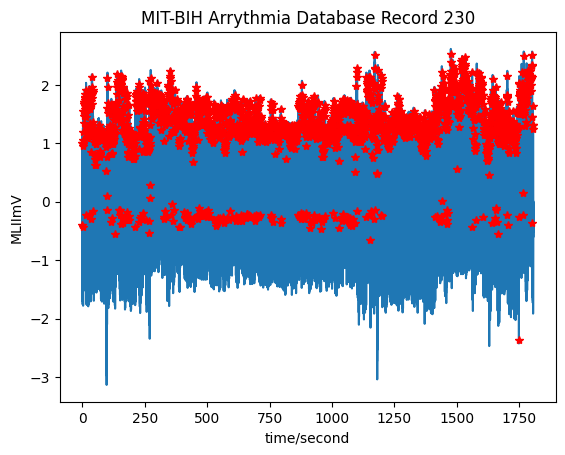

2465 reference annotations, 2257 test annotations

True Positives (matched samples): 2256
False Positives (unmatched test samples): 1
False Negatives (unmatched reference samples): 209

Sensitivity: 0.9152 (2256/2465)
Positive Predictivity: 0.9996 (2256/2257)


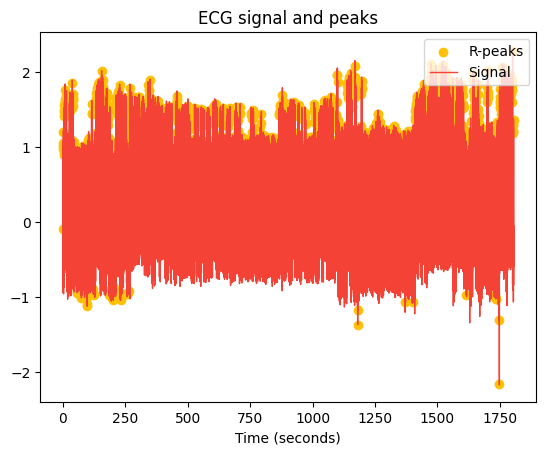

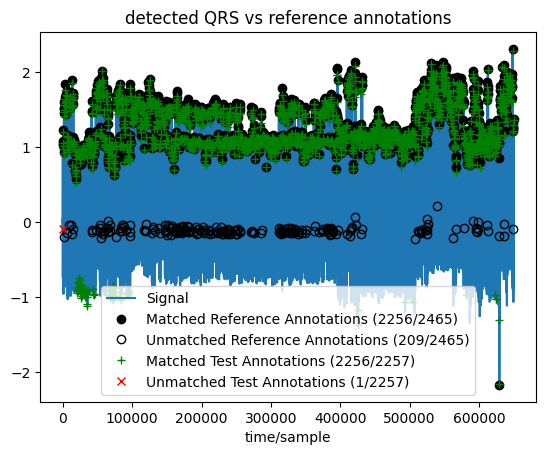

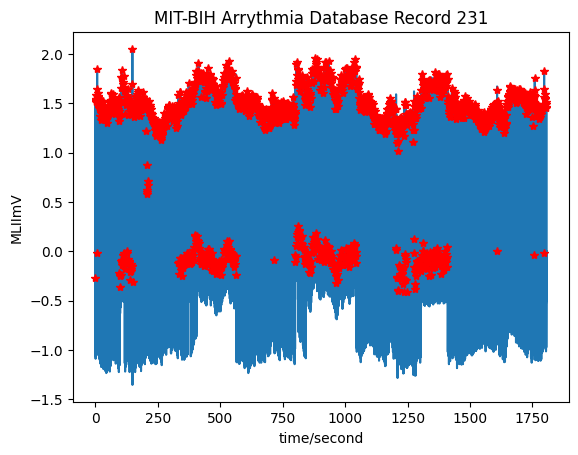

2010 reference annotations, 1572 test annotations

True Positives (matched samples): 1570
False Positives (unmatched test samples): 2
False Negatives (unmatched reference samples): 440

Sensitivity: 0.7811 (1570/2010)
Positive Predictivity: 0.9987 (1570/1572)


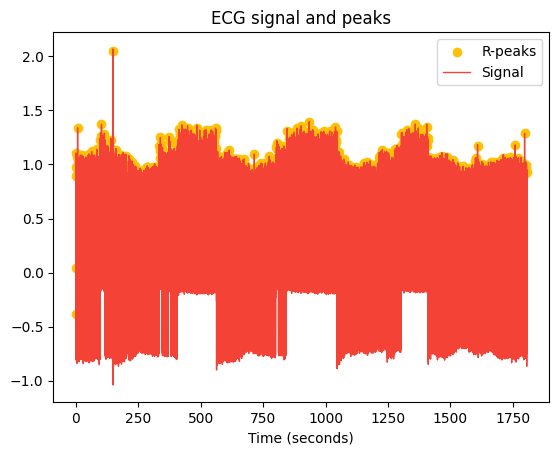

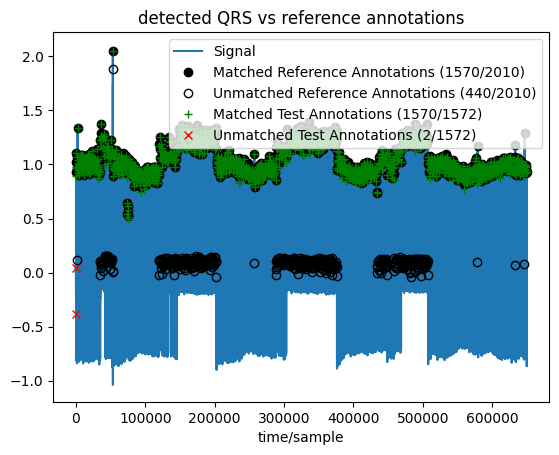

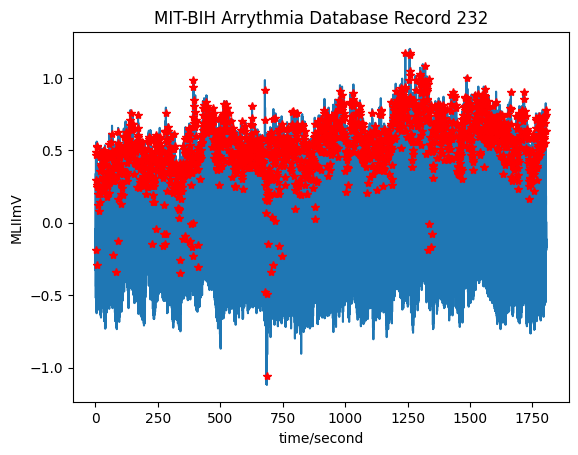

1815 reference annotations, 2012 test annotations

True Positives (matched samples): 1781
False Positives (unmatched test samples): 231
False Negatives (unmatched reference samples): 34

Sensitivity: 0.9813 (1781/1815)
Positive Predictivity: 0.8852 (1781/2012)


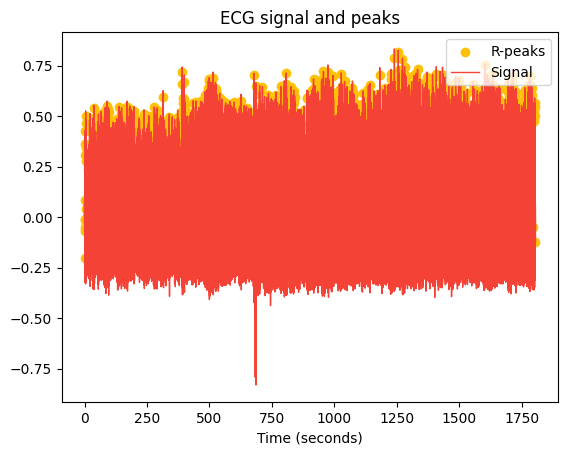

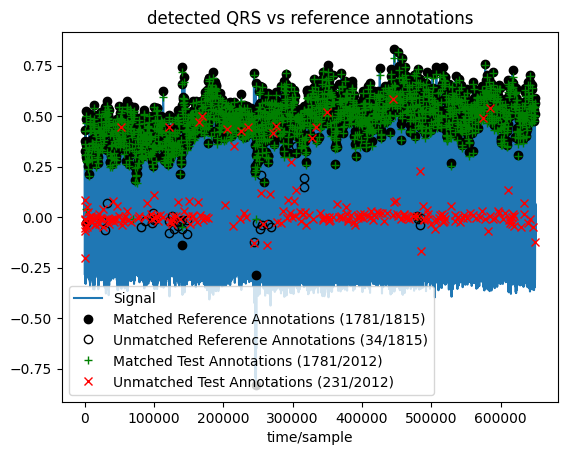

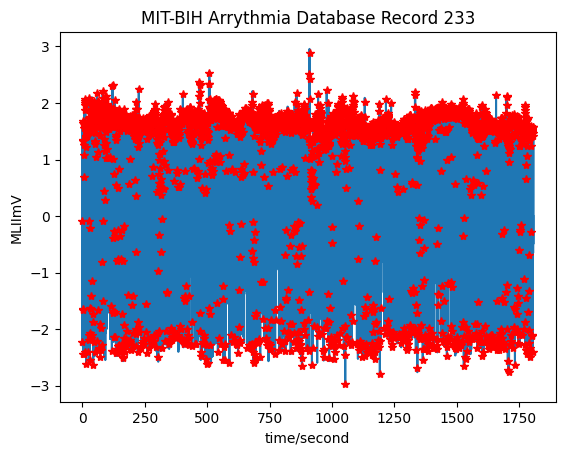

3151 reference annotations, 3046 test annotations

True Positives (matched samples): 3046
False Positives (unmatched test samples): 0
False Negatives (unmatched reference samples): 105

Sensitivity: 0.9667 (3046/3151)
Positive Predictivity: 1.0000 (3046/3046)


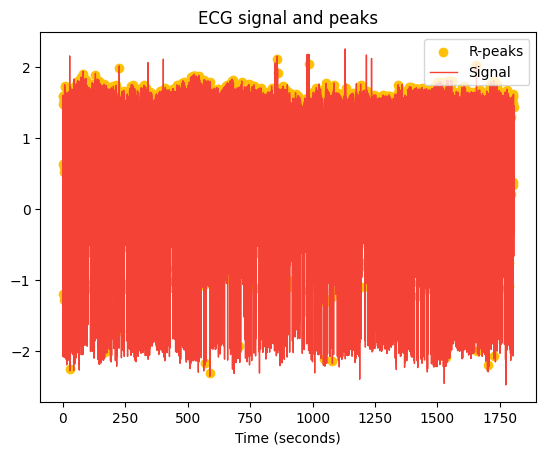

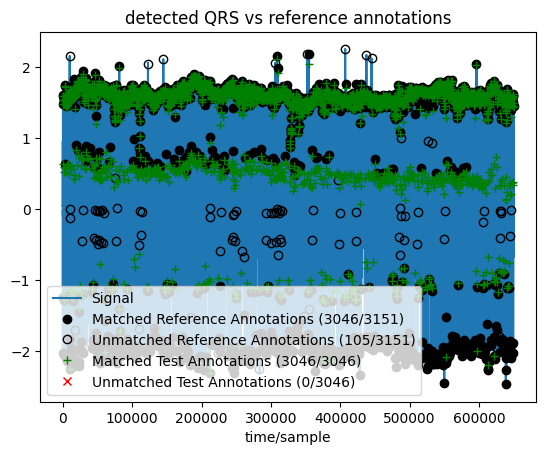

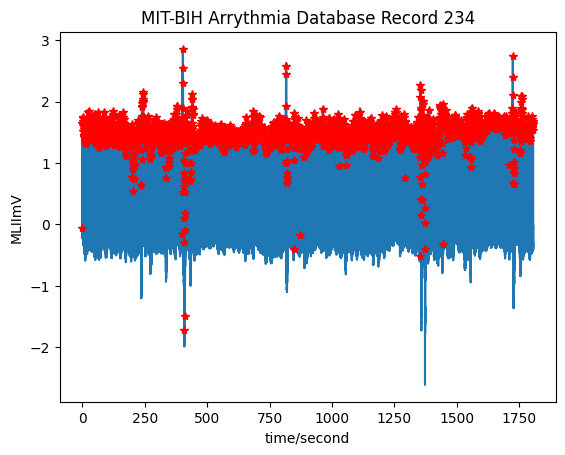

2763 reference annotations, 2750 test annotations

True Positives (matched samples): 2749
False Positives (unmatched test samples): 1
False Negatives (unmatched reference samples): 14

Sensitivity: 0.9949 (2749/2763)
Positive Predictivity: 0.9996 (2749/2750)


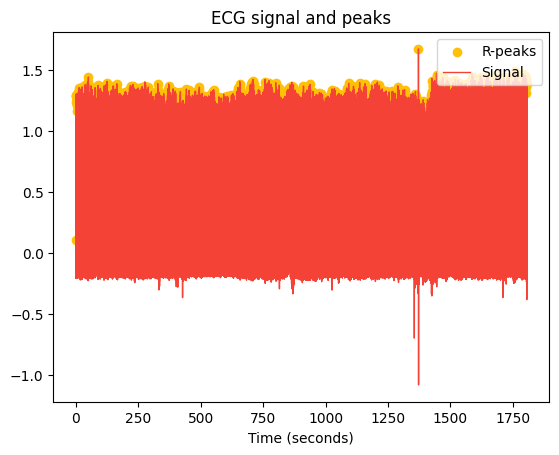

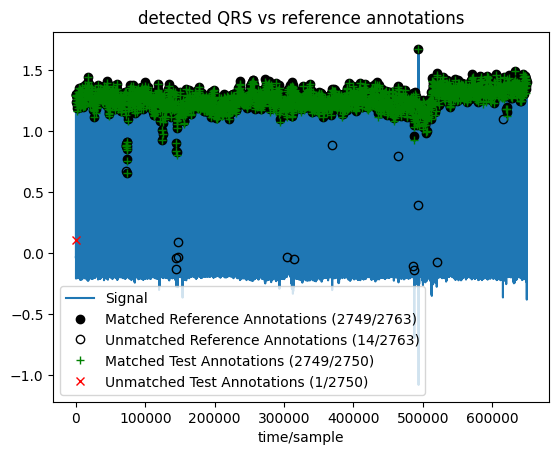

In [ ]:
# List of record
record_names = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '111', '112', '113', '114', '115', '116', '117', '118', '119', '121', '122', '123', '124', '200', '201', '202', '203', '205', '207', '208', '209', '210', '212', '213', '214', '215', '217', '219', '220', '221', '222', '223', '228', '230', '231', '232', '233', '234']
# record_names = ['207']
for record_name in record_names:

    csv_filename = f'/content/drive/MyDrive/Experiments/mitbih-database/Xtract/record_{record_name}.csv'

    data_list = []

    record = wfdb.rdrecord(f'/content/drive/MyDrive/Experiments/mitbih-database/{record_name}', channels=[0])
    annotation = wfdb.rdann(f'/content/drive/MyDrive/Experiments/mitbih-database/{record_name}', extension='atr')

    wfdb.plot_wfdb(record=record, annotation=annotation, title=f'MIT-BIH Arrythmia Database Record {record_name}', time_units='seconds')

    filtered_ecg = nk.ecg_clean(ecg_signal=record.p_signal, sampling_rate=record.fs, method='neurokit')

    _, info_ecg = nk.ecg_peaks(ecg_cleaned=filtered_ecg, sampling_rate=record.fs, method='rodrigues2021', show=True)
    r_peaks_ecg = info_ecg['ECG_R_Peaks']

    comparitor_qrs(ann=annotation, peak=r_peaks_ecg, fs=record.fs, sig=filtered_ecg)

    for peak in r_peaks_ecg[2:-1]:
        start, end = peak-input_size//2, peak+input_size//2

        ann = wfdb.rdann(f'/content/drive/MyDrive/Experiments/mitbih-database/{record_name}', extension='atr', sampfrom=start, sampto=end, return_label_elements=['symbol'])
        ann_symbol = ann.symbol

        if len(ann_symbol) == 1 and (ann_symbol[0] in classes) and (ann_symbol[0] != 'N' or np.random.random()<0.13):
            row_data = np.append(filtered_ecg[start:end], ann_symbol[0])
            data_list.append(row_data)


    # Save to CSV file
    with open(csv_filename, 'w', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)

        # Write data
        csv_writer.writerows(data_list)

In [ ]:
for record_name in record_names:
    df = pd.read_csv(f'/content/drive/MyDrive/Experiments/mitbih-database/Xtract/record_{record_name}.csv')
    df.head()

    unique_labels = df.iloc[:, -1].unique()
    print(record_name, unique_labels)

100 ['A' 'N' 'V']
101 ['N' 'A']
102 ['N' 'V']
103 ['N' 'A']
104 ['N' 'V']
105 ['N' 'V']
106 ['N' 'V']
107 ['V']
108 ['N' 'V' 'A' 'F']
109 ['L' 'F' 'V']
111 ['L' 'V']
112 ['N' 'A']
113 ['a' 'N']
114 ['N' 'V' 'J' 'F' 'A']
115 ['N']
116 ['N' 'V' 'A']
117 ['N' 'A']
118 ['R' 'V' 'A']
119 ['V' 'N']
121 ['N' 'A' 'V' nan]
122 ['N']
123 ['N']
124 ['R' 'J' 'V' 'F' 'A']
200 ['V' 'N' 'A' 'F']
201 ['N' 'a' 'V' 'A' 'J' 'F']
202 ['N' 'V' 'A' 'a' 'F']
203 ['V' 'N' 'a']
205 ['N' 'V' 'F' 'A']
207 ['V' 'R' 'L' 'E' 'A']
208 ['V' 'F' 'N']
209 ['N' 'A' 'V']
210 ['N' 'F' 'V' 'a' 'E']
212 ['R' 'N']
213 ['N' 'F' 'A' 'V' 'a']
214 ['L' 'V' 'F']
215 ['N' 'V' 'A']
217 ['V' 'N']
219 ['N' 'V' 'F' 'A']
220 ['N' 'A']
221 ['V' 'N']
222 ['N' 'A' 'J']
223 ['N' 'V' 'A' 'F' 'a']
228 ['N' 'V' 'A']
230 ['N' 'V']
231 ['R' 'N' 'A']
232 ['R' 'A']
233 ['V' 'N' 'A' 'F']
234 ['N' 'J']
